<a href="https://colab.research.google.com/github/NazraJN/Conflict-and-terrorism/blob/main/Conflictandterrorism.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json

In [2]:
with open('datapackage(1).json') as f:
   data = json.load(f)
data

{'name': 'Conflict and Terrorism deaths - OWID based on IHME & GTD',
 'title': 'Conflict and Terrorism deaths - OWID based on IHME & GTD',
 'id': 2400,
 'description': "Data for conflict and terrorism deaths has been differentiated by Our World in Data based on published figures by the IHME, Global Burden of Disease (GBD), and Global Terrorism Database (GTD).\n\nThe IHME, GBD report combined deaths from 'Conflict and Terrorism'. To differentiate 'conflict' deaths, we have subtracted number of terrorism deaths published by the GTD from this combined metric of 'Conflict and Terrorism'. \n\nWe have also calculated both of these individual parameters in terms of the percentage of total deaths, by dividing by IHME figures of deaths for 'All causes'.\n\nNote that in some cases, estimates of homicide, conflict and terrorism can be challenging to differentiate, with different estimates from different sources and definitions. For terrorism, we have used data from the GTD; full data and definiti

In [3]:
# load the datasets
df = pd.read_csv('Conflict_and_Terrorism_deaths.csv')
df

,Entity,Year,Terrorism (deaths),Conflict (deaths),Terrorism (percent),Conflict (percent)
0,Afghanistan,1990,12,1508,0.007,0.932
1,Afghanistan,1991,68,3498,0.040,2.044
2,Afghanistan,1992,49,4341,0.027,2.408
3,Afghanistan,1994,22,9090,0.010,4.296
4,Afghanistan,1995,5,5639,0.002,2.557
...,...,...,...,...,...,...
4753,Zimbabwe,2012,0,0,0.000,0.000
4754,Zimbabwe,2013,1,0,0.001,0.000
4755,Zimbabwe,2014,0,0,0.000,0.000
4756,Zimbabwe,2015,0,0,0.000,0.000


## EDA

In [4]:
df.head()

,Entity,Year,Terrorism (deaths),Conflict (deaths),Terrorism (percent),Conflict (percent)
0,Afghanistan,1990,12,1508,0.007,0.932
1,Afghanistan,1991,68,3498,0.040,2.044
2,Afghanistan,1992,49,4341,0.027,2.408
3,Afghanistan,1994,22,9090,0.010,4.296
4,Afghanistan,1995,5,5639,0.002,2.557


In [5]:
df.tail()

,Entity,Year,Terrorism (deaths),Conflict (deaths),Terrorism (percent),Conflict (percent)
4753,Zimbabwe,2012,0,0,0.000,0.0
4754,Zimbabwe,2013,1,0,0.001,0.0
4755,Zimbabwe,2014,0,0,0.000,0.0
4756,Zimbabwe,2015,0,0,0.000,0.0
4757,Zimbabwe,2016,0,0,0.000,0.0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4758 entries, 0 to 4757
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Entity               4758 non-null   object 
 1   Year                 4758 non-null   int64  
 2   Terrorism (deaths)   4758 non-null   int64  
 3   Conflict (deaths)    4758 non-null   int64  
 4   Terrorism (percent)  4758 non-null   float64
 5   Conflict (percent)   4758 non-null   float64
dtypes: float64(2), int64(3), object(1)
memory usage: 223.2+ KB


In [7]:
df.isna().sum()

Entity                 0
Year                   0
Terrorism (deaths)     0
Conflict (deaths)      0
Terrorism (percent)    0
Conflict (percent)     0
dtype: int64

In [8]:
df.drop('Year', axis=1).describe()

,Terrorism (deaths),Conflict (deaths),Terrorism (percent),Conflict (percent)
count,4758.000000,4758.000000,4758.000000,4758.000000
mean,166.113703,1178.482766,0.037337,0.290878
std,1317.011043,14412.954221,0.229321,2.398786
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,8.000000,30.000000,0.004000,0.017000
max,43566.000000,543424.000000,5.877000,82.317000


In [9]:
df['Year'].unique()

array([1990, 1991, 1992, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001,
       2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013, 2014, 2015, 2016])

In [10]:
df['Entity'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Central Asia', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', 'Croatia',
       'Cuba', 'Cyprus', 'Czech Republic', 'Democratic Republic of Congo',
       'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic',
       'East Asia', 'Eastern Europe', 'Ecuador', 'Egypt', 'El Salvador',
       'Equatorial Guinea', 'Eritrea', 'Estonia', 'Ethiopia', 'Fiji',
       'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany',
       'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea',
       'Guinea-Bissau', 'Guyana', 'Haiti', 'Hond

In [11]:
# Filter out rows with the specified entities from the dataframe
df = df[~df['Entity'].isin(['Central Asia', 'East Asia', 'Eastern Europe', 'North America', 'Oceania', 'South Asia', 'Southeast Asia', 'Sub-Saharan Africa', 'Western Europe', 'World'])]

In [12]:
df['Entity'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Comoros', 'Congo', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czech Republic', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia',
       'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala',
       'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras',
       'Hungary', 'Iceland', 'India', 'Indonesi

In [13]:
print(len(df['Entity'].unique()))

173


In [14]:
# Define dictionaries to map countries to continents
continent_mapping = {
    'Africa': ['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo', 'Democratic Republic of Congo', 'Djibouti', 'Egypt', 'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Ivory Coast', 'Kenya', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'Sao Tome and Principe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'South Sudan', 'Sudan', 'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Asia': ['Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan', 'Brunei', 'Cambodia', 'China', 'East Timor', 'Georgia', 'India', 'Indonesia', 'Iran', 'Iraq', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'North Korea', 'South Korea', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Lebanon', 'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal', 'Oman', 'Pakistan', 'Palestine', 'Philippines', 'Qatar', 'Saudi Arabia', 'Singapore', 'Sri Lanka', 'Syria', 'Tajikistan', 'Thailand', 'Turkey', 'Turkmenistan', 'United Arab Emirates', 'Uzbekistan', 'Vietnam', 'Yemen'],
    'Europe': ['Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Moldova', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican City'],
    'North America': ['Antigua and Barbuda', 'Bahamas', 'Barbados', 'Belize', 'Canada', 'Costa Rica', 'Cuba', 'Dominica', 'Dominican Republic', 'El Salvador', 'Grenada', 'Guatemala', 'Haiti', 'Honduras', 'Jamaica', 'Mexico', 'Nicaragua', 'Panama', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Trinidad and Tobago', 'United States'],
    'Oceania': ['Australia', 'Fiji', 'Kiribati', 'Marshall Islands', 'Micronesia', 'Nauru', 'New Zealand', 'Palau', 'Papua New Guinea', 'Samoa', 'Solomon Islands', 'Tonga', 'Tuvalu', 'Vanuatu']
}

# Create a new column 'Continent' based on the mapping
for continent, countries in continent_mapping.items():
    df.loc[df['Entity'].isin(countries), 'Continent'] = continent


<ipython-input-14-850c52f7c19b>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[df['Entity'].isin(countries), 'Continent'] = continent


### Africa

#### Overall trend in conflict and terrorism rates in Africa

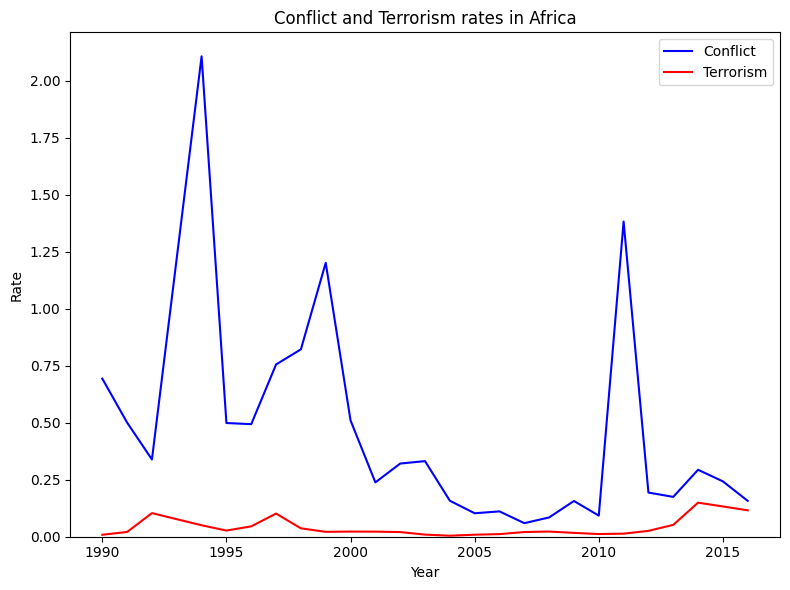

In [15]:
# Group data by year and calculate mean conflict and terrorism rates for Africa
df_africa = df[df['Continent'] == 'Africa']
conflict_and_terrorism_africa = df_africa.groupby('Year').mean(numeric_only=True)


# Plot both trend lines on the same graph
plt.figure(figsize=(8, 6))
plt.plot(conflict_and_terrorism_africa.index, conflict_and_terrorism_africa['Conflict (percent)'], color='blue', label='Conflict')
plt.plot(conflict_and_terrorism_africa.index, conflict_and_terrorism_africa['Terrorism (percent)'], color='red', label='Terrorism')
plt.title('Conflict and Terrorism rates in Africa')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.legend()

# Set the y-axis to start from 0
plt.ylim(0)

plt.tight_layout()
plt.show()

#### Year by year analysis

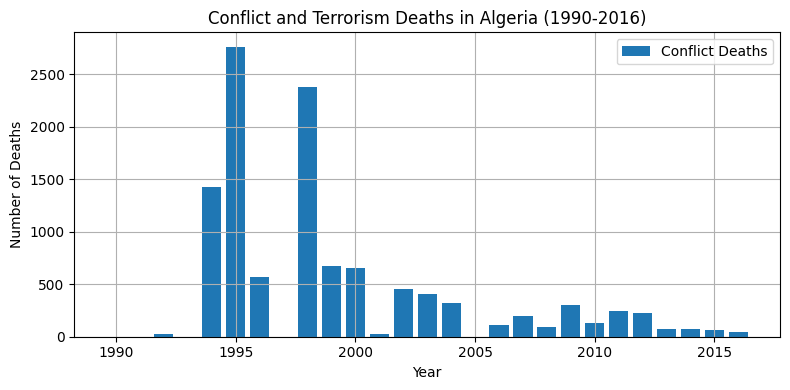

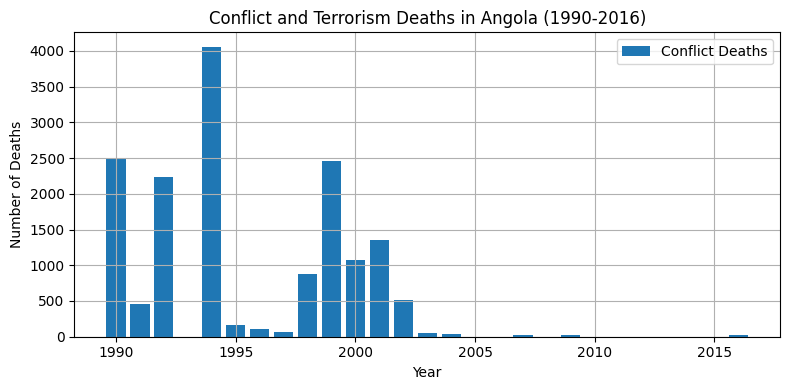

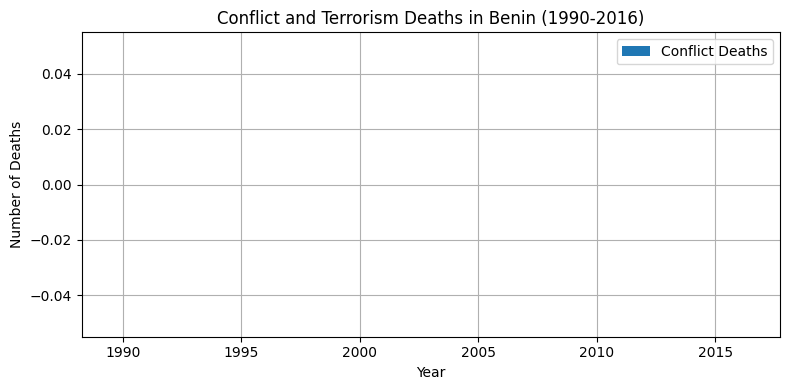

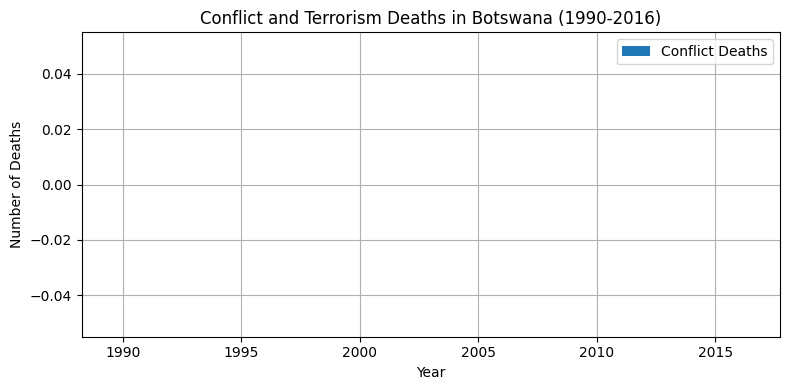

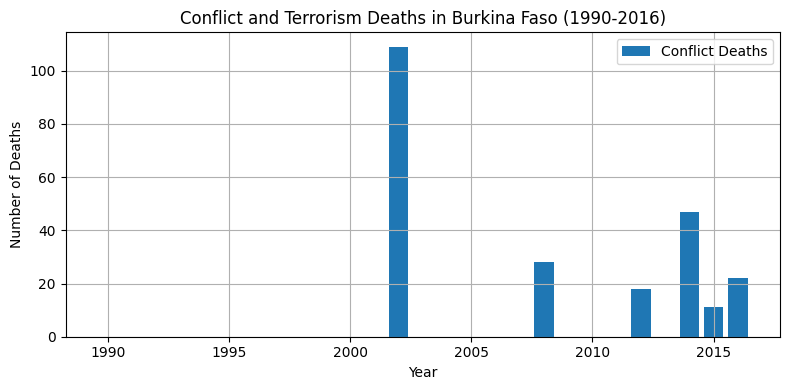

...

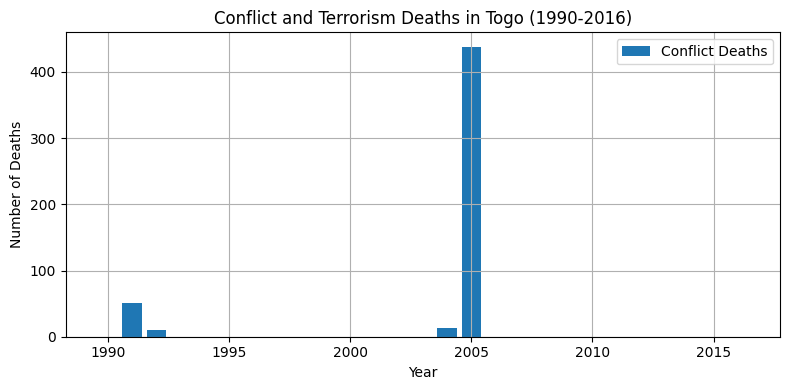

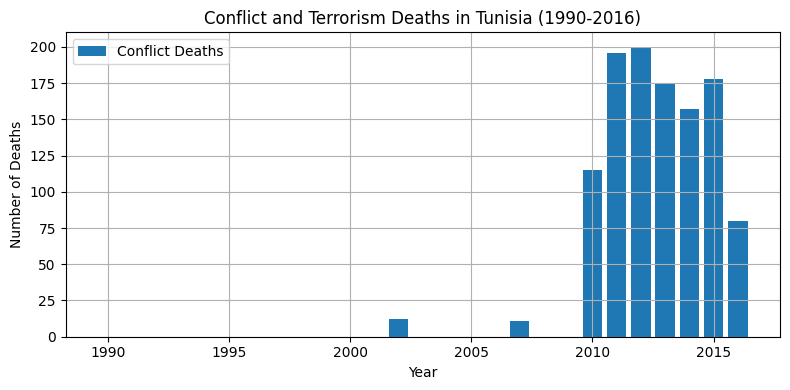

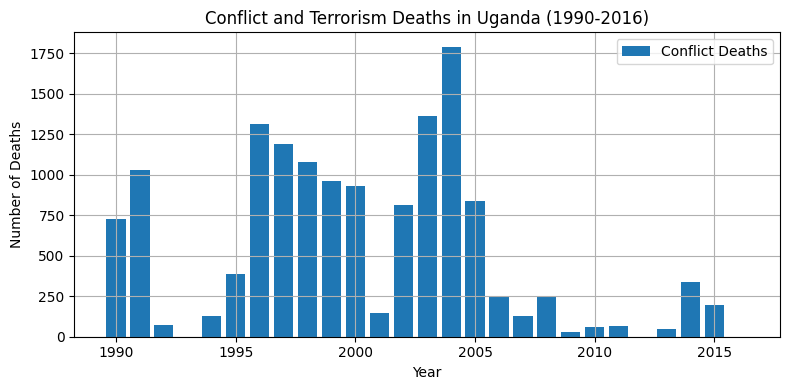

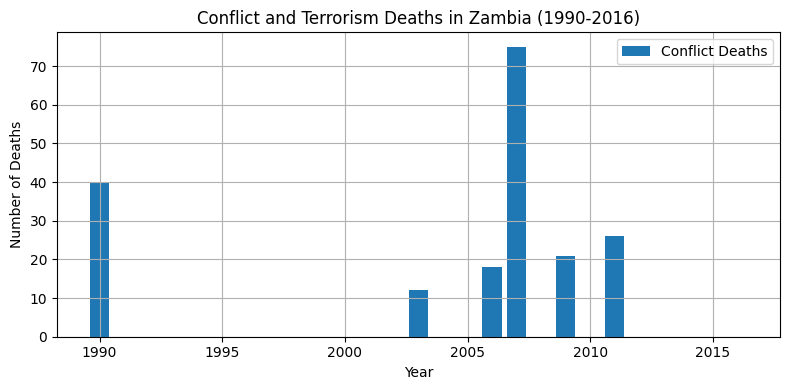

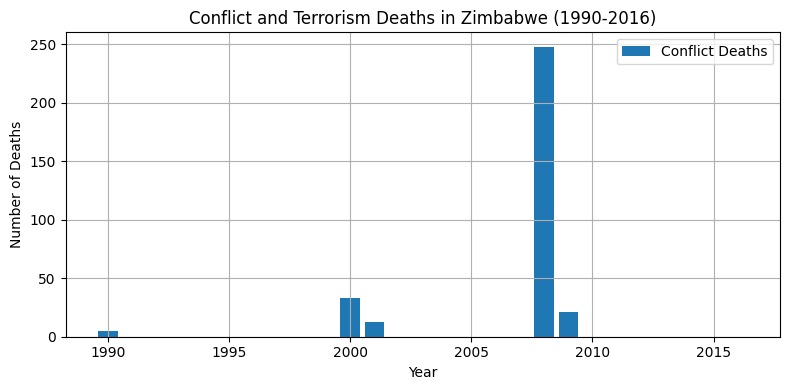

In [16]:
# Get unique country names in Africa
countries_africa = df_africa['Entity'].unique()

# Plot each country individually
for country in countries_africa:
    # Filter data for the current country
    df_country = df_africa[df_africa['Entity'] == country]

    # Plotting
    plt.figure(figsize=(8, 4))
    plt.bar(df_country['Year'], df_country['Conflict (deaths)'], label='Conflict Deaths')
    #plt.bar(df_country['Year'], df_country['Terrorism (deaths)'], label='Terrorism Deaths')
    plt.xlabel('Year')
    plt.ylabel('Number of Deaths')
    plt.title(f'Conflict and Terrorism Deaths in {country} (1990-2016)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


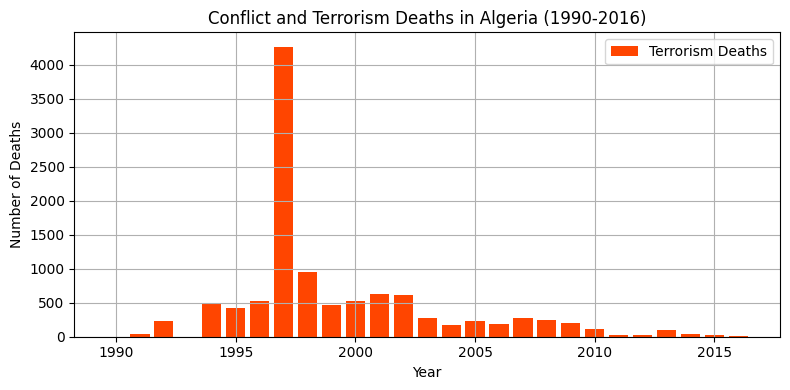

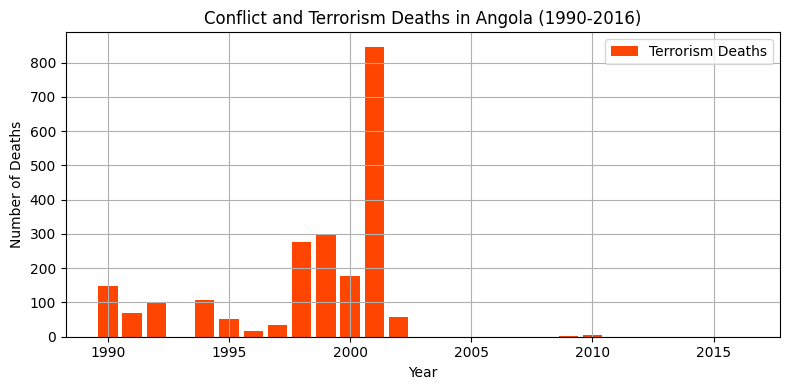

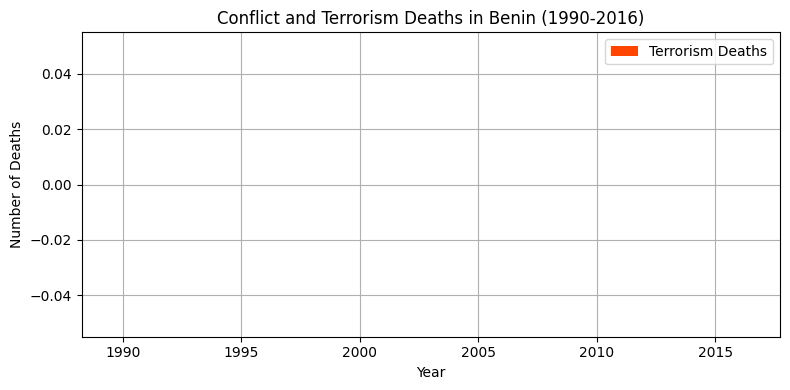

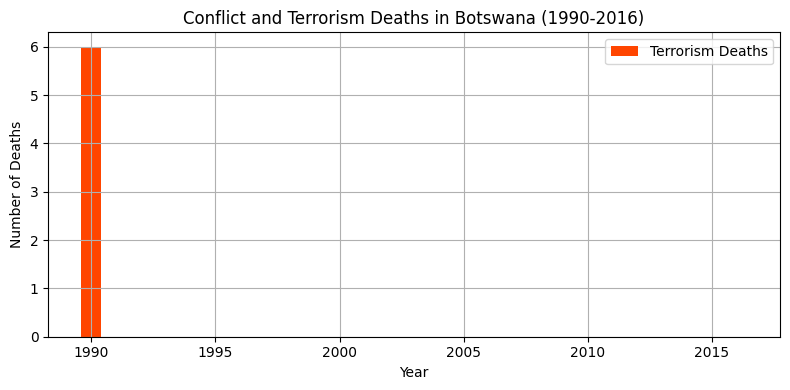

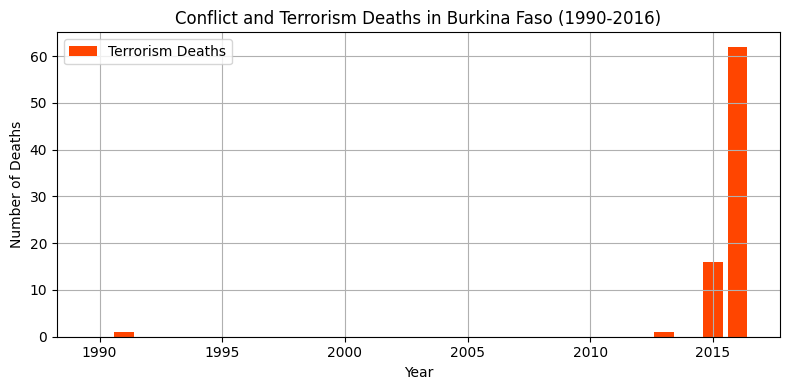

...

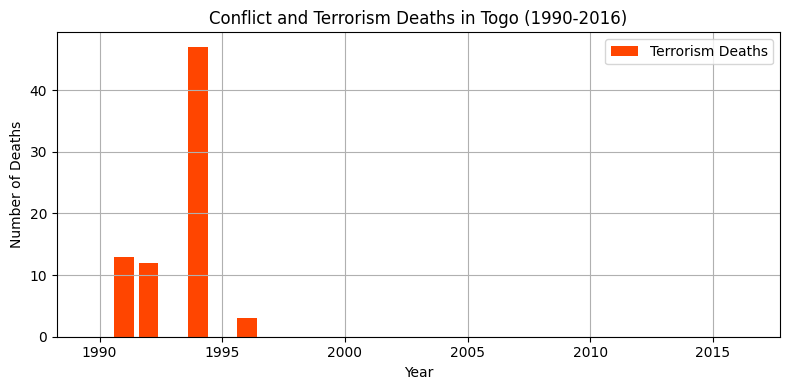

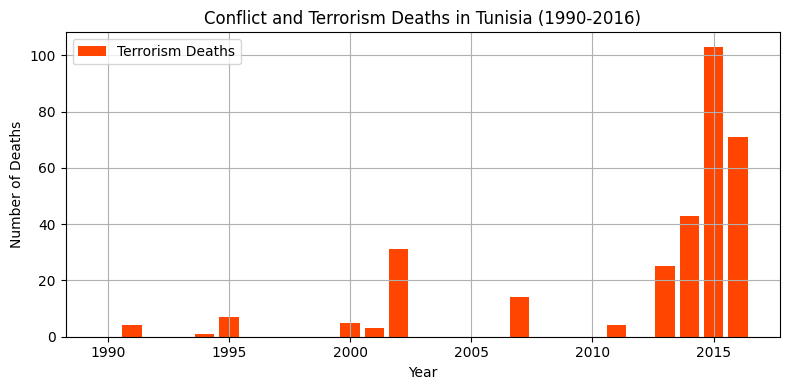

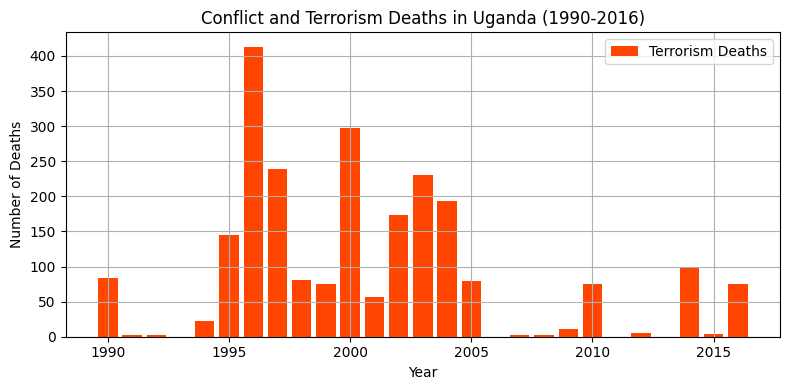

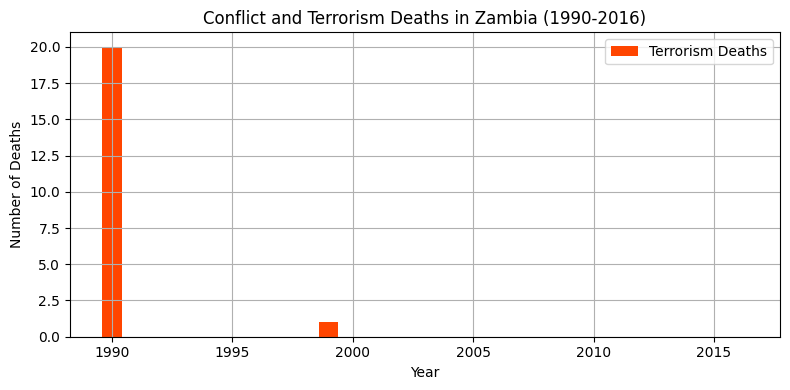

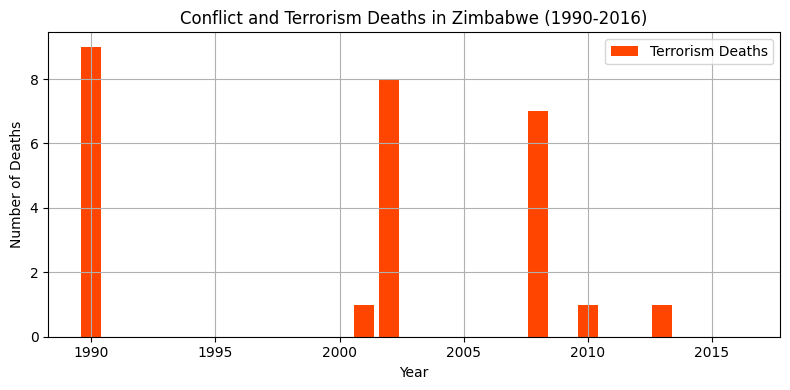

In [17]:
# Plot each country individually
for country in countries_africa:
    # Filter data for the current country
    df_country = df_africa[df_africa['Entity'] == country]

    # Plotting
    plt.figure(figsize=(8, 4))
    #plt.bar(df_country['Year'], df_country['Conflict (deaths)'], label='Conflict Deaths')
    plt.bar(df_country['Year'], df_country['Terrorism (deaths)'], label='Terrorism Deaths', color='orangered')
    plt.xlabel('Year')
    plt.ylabel('Number of Deaths')
    plt.title(f'Conflict and Terrorism Deaths in {country} (1990-2016)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## Asia

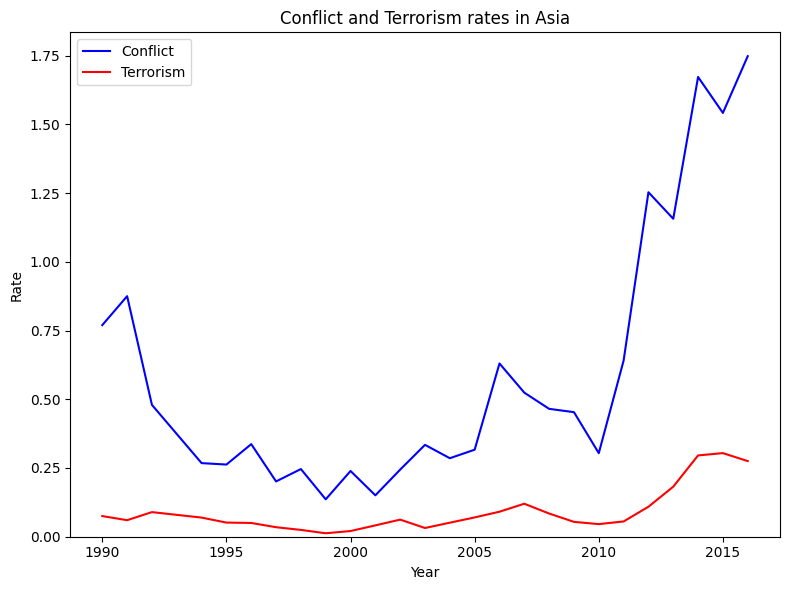

In [18]:
# Group data by year and calculate mean conflict and terrorism rates for Asia
df_asia = df[df['Continent'] == 'Asia']
conflict_and_terrorism_asia = df_asia.groupby('Year').mean(numeric_only=True)


# Plot both trend lines on the same graph
plt.figure(figsize=(8, 6))
plt.plot(conflict_and_terrorism_asia.index, conflict_and_terrorism_asia['Conflict (percent)'], color='blue', label='Conflict')
plt.plot(conflict_and_terrorism_asia.index, conflict_and_terrorism_asia['Terrorism (percent)'], color='red', label='Terrorism')
plt.title('Conflict and Terrorism rates in Asia')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.legend()

# Set the y-axis to start from 0
plt.ylim(0)

plt.tight_layout()
plt.show()

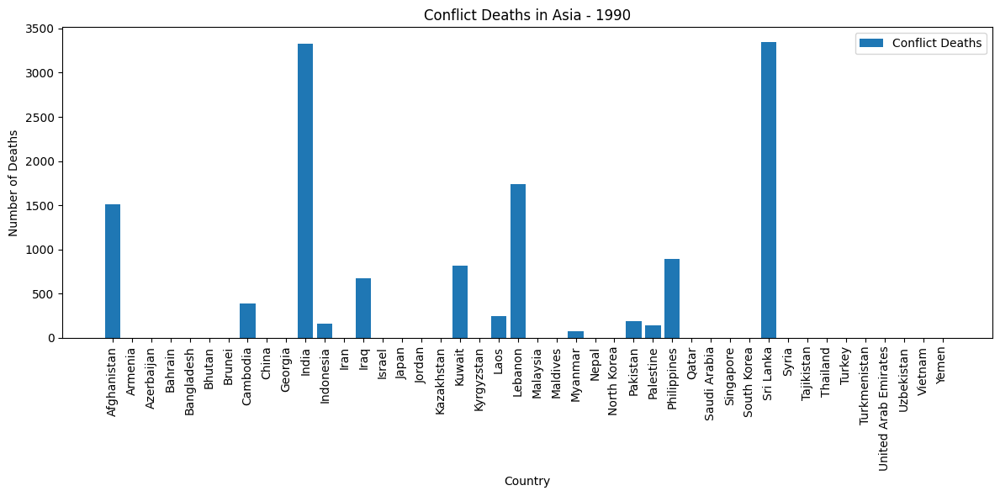

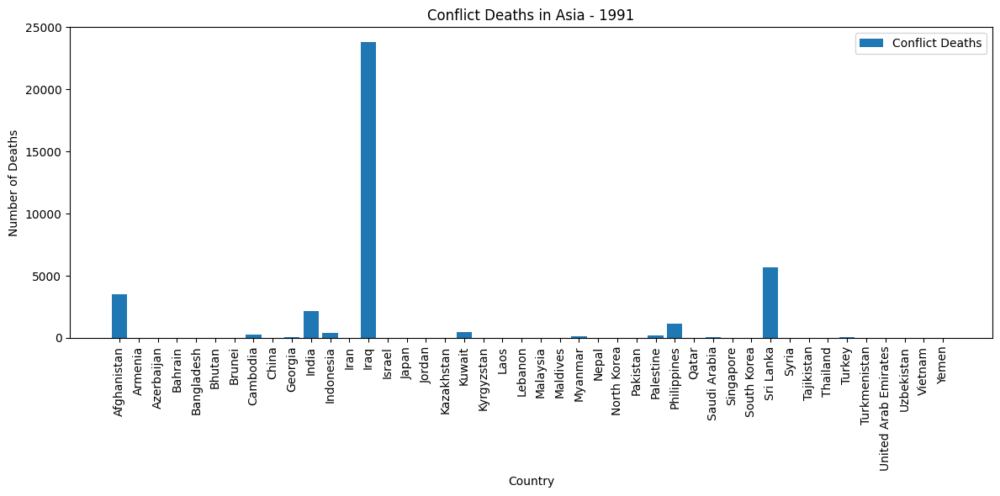

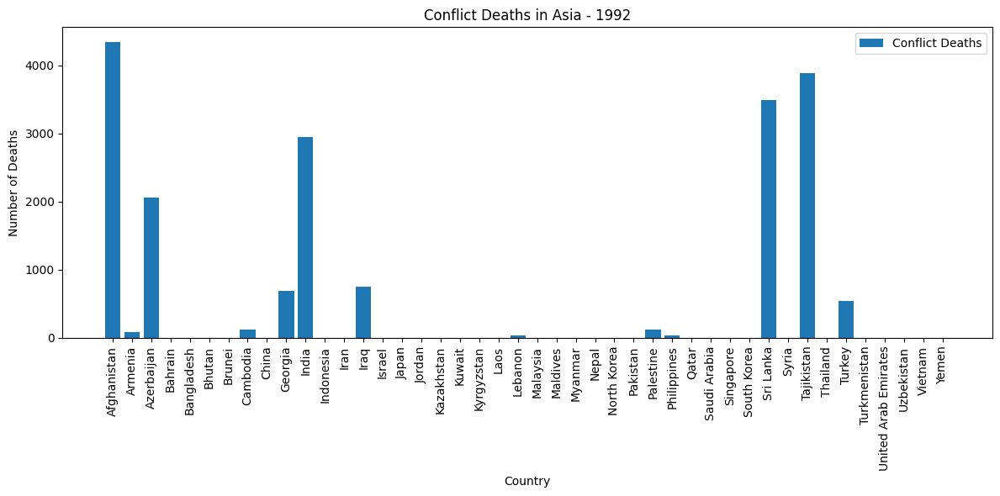

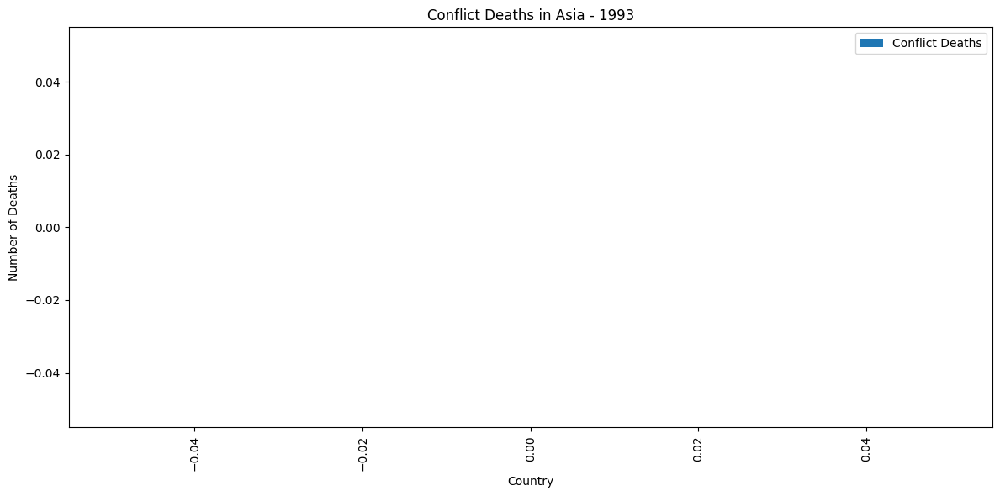

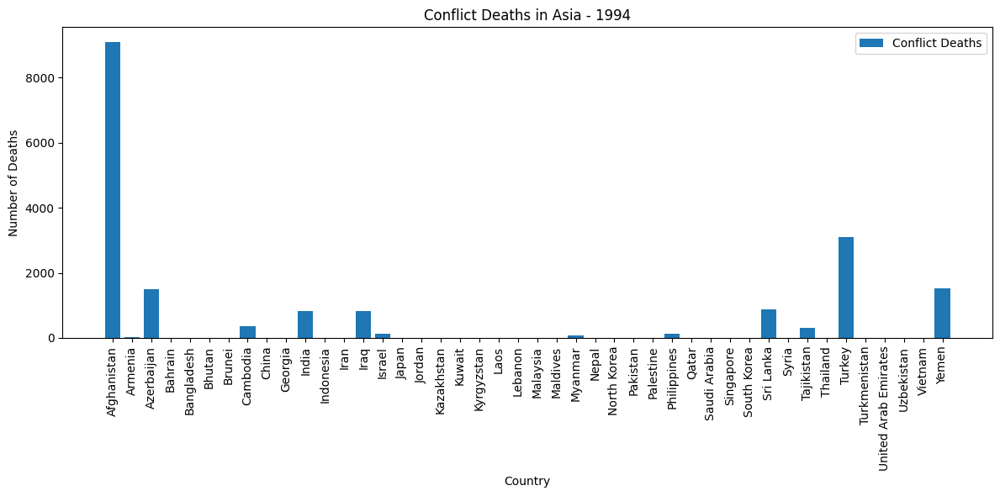

...

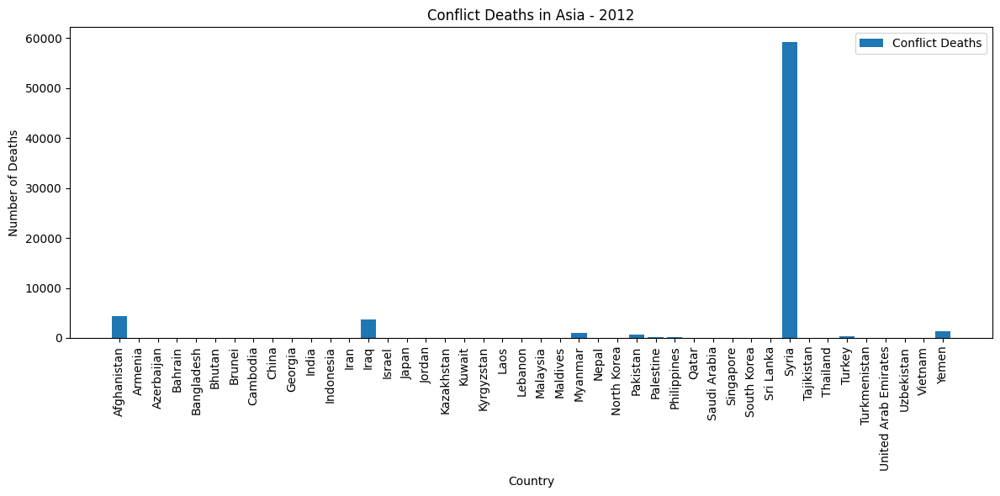

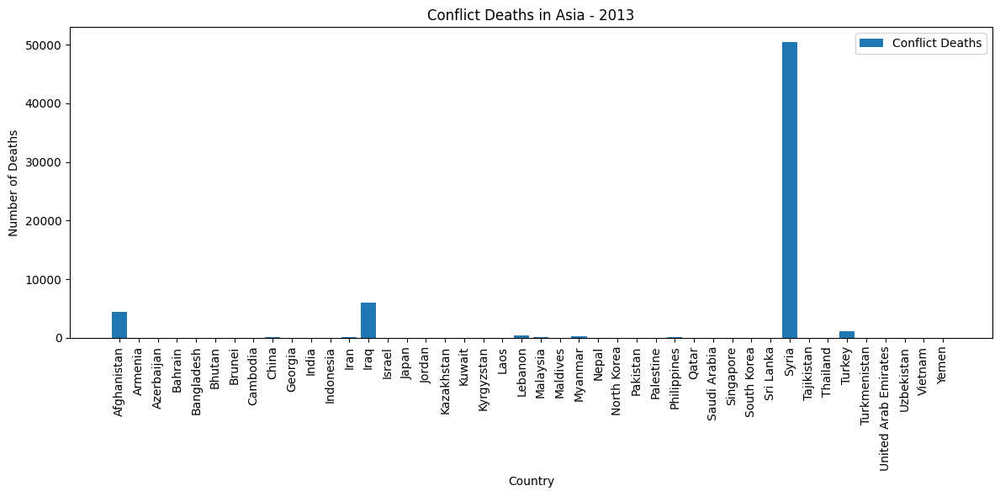

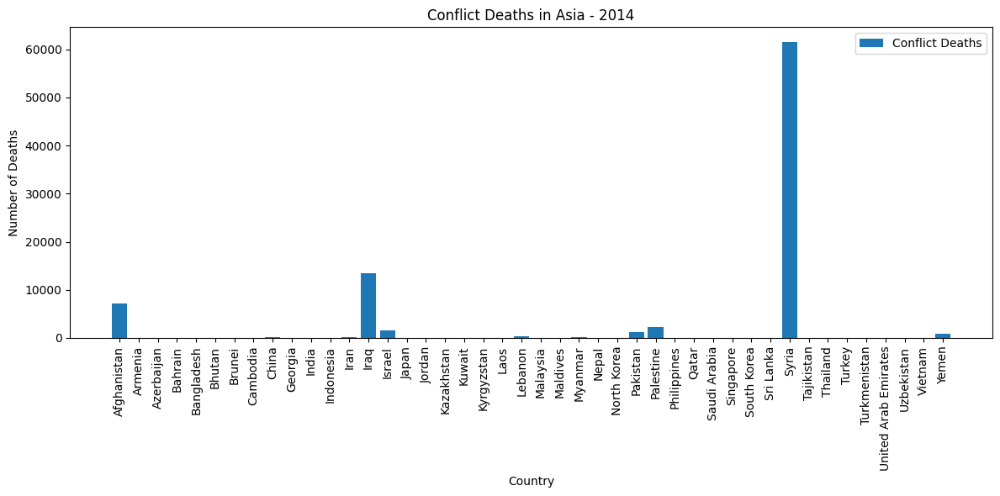

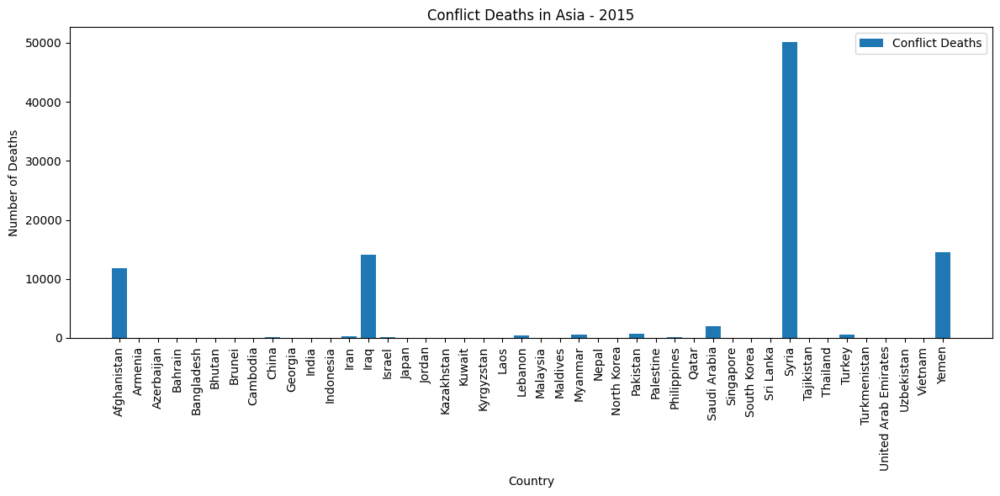

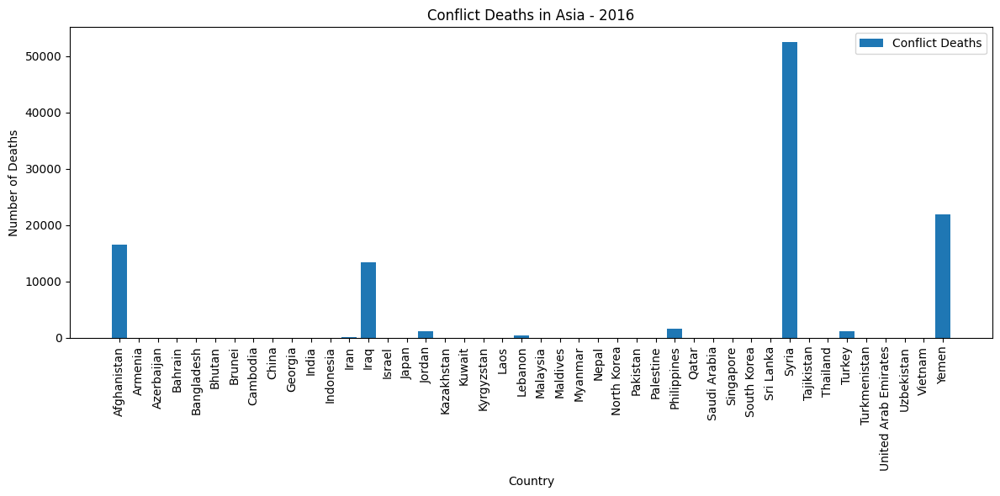

In [19]:
# Iterate through each year from 1990 to 2016
for year in range(1990, 2017):
    # Filter data for the current year
    df_year = df_asia[df_asia['Year'] == year]

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(df_year['Entity'], df_year['Conflict (deaths)'], label='Conflict Deaths')
    plt.xlabel('Country')
    plt.ylabel('Number of Deaths')
    plt.title(f'Conflict Deaths in Asia - {year}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()


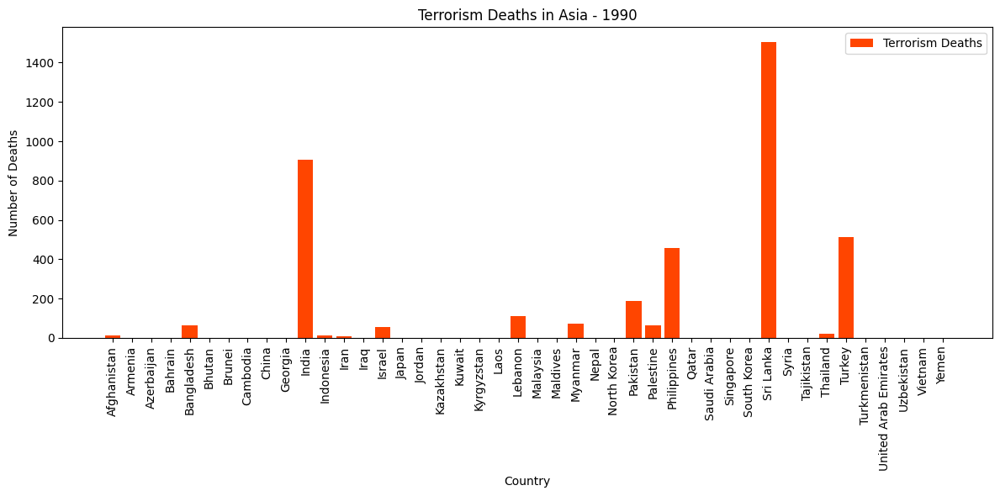

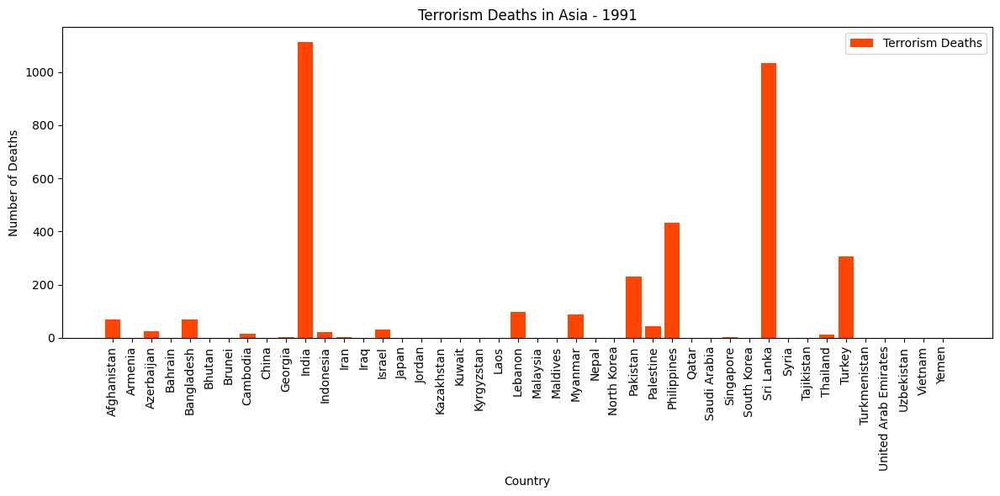

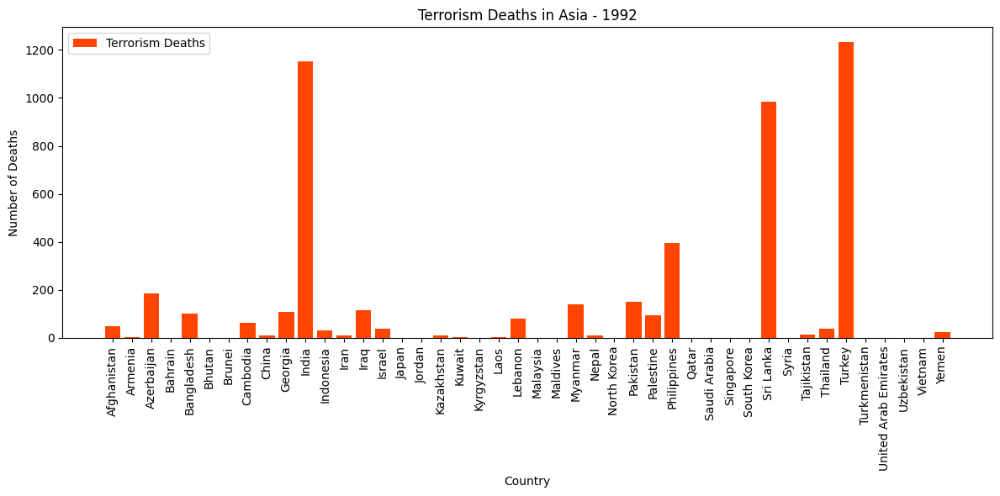

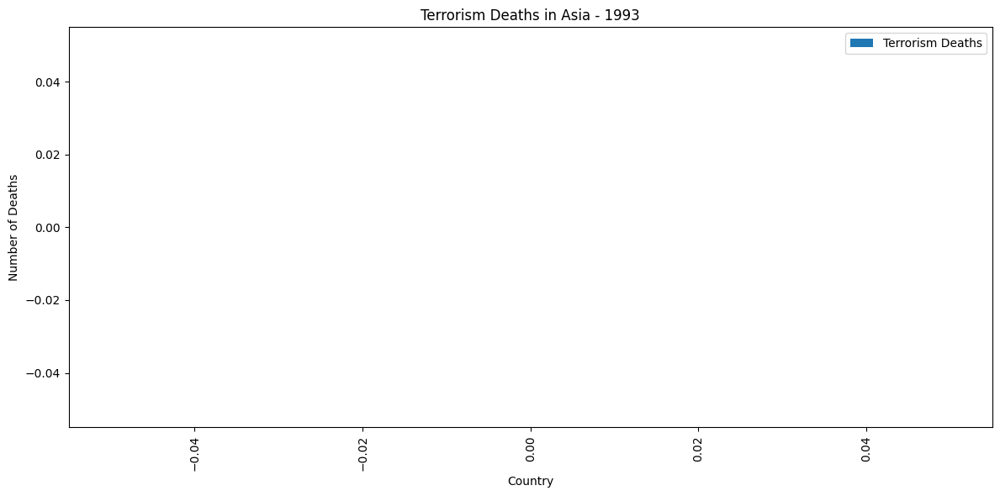

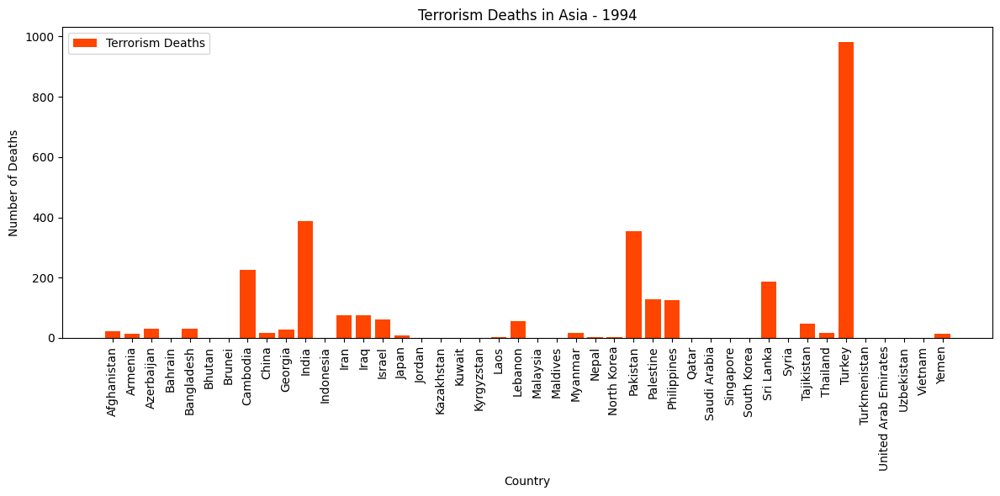

...

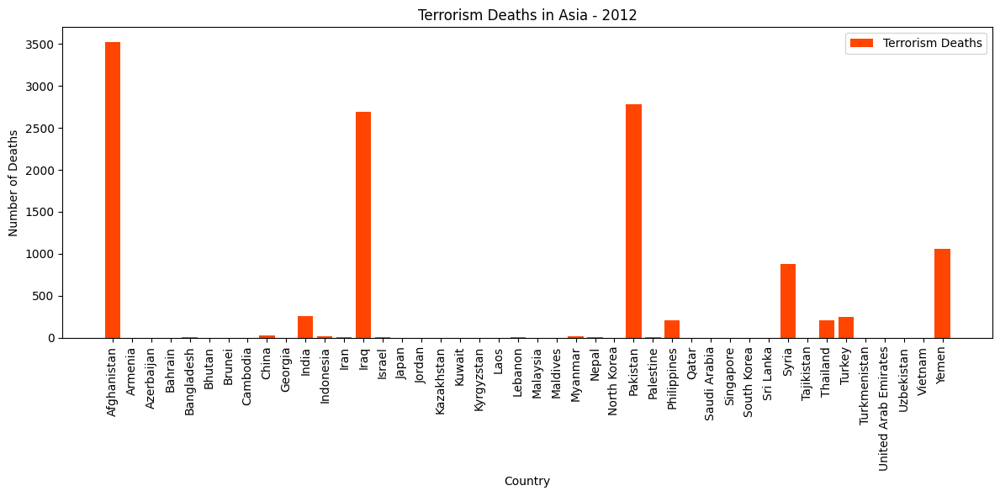

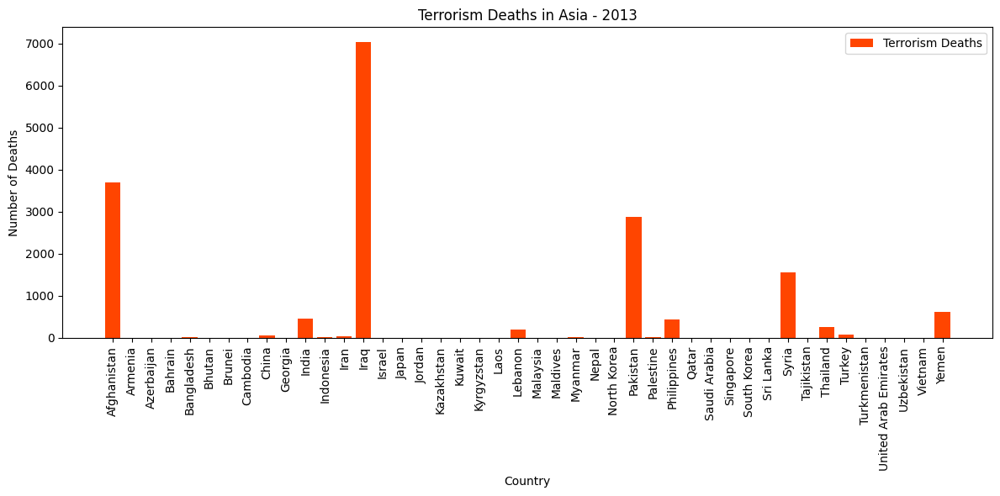

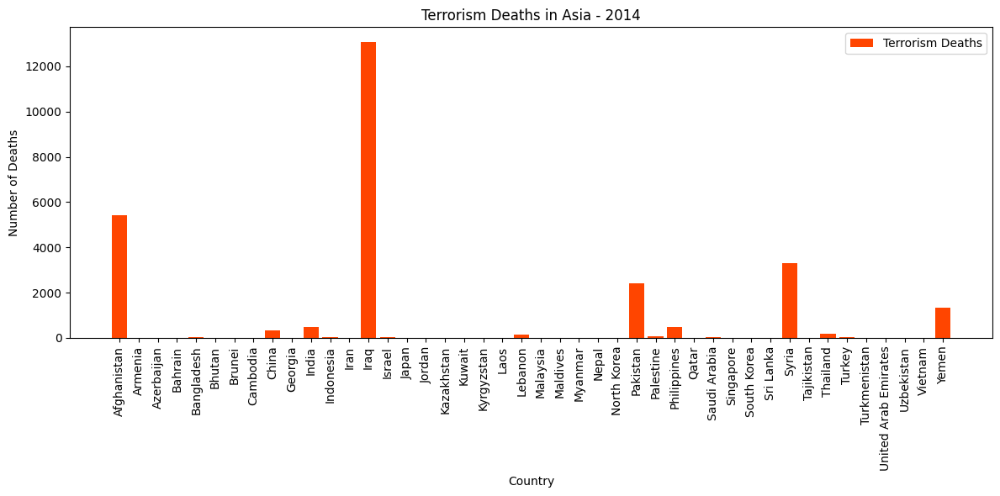

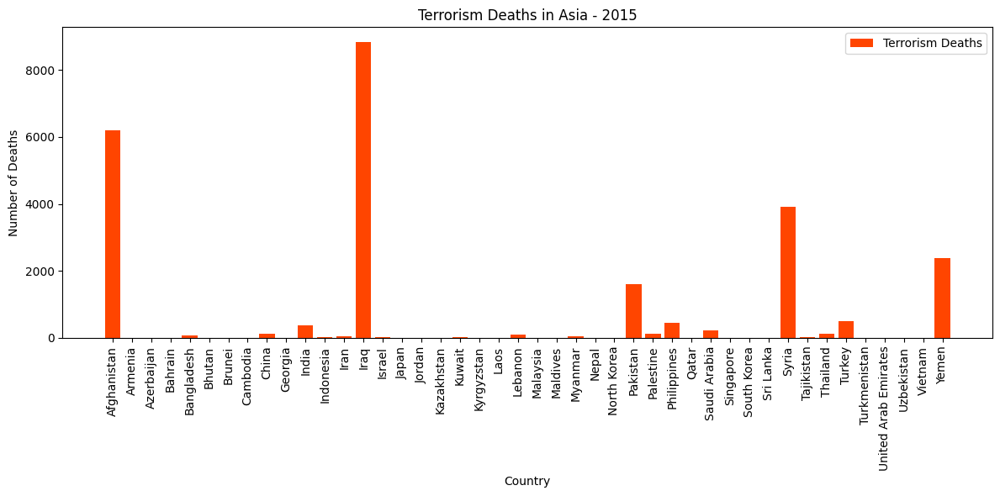

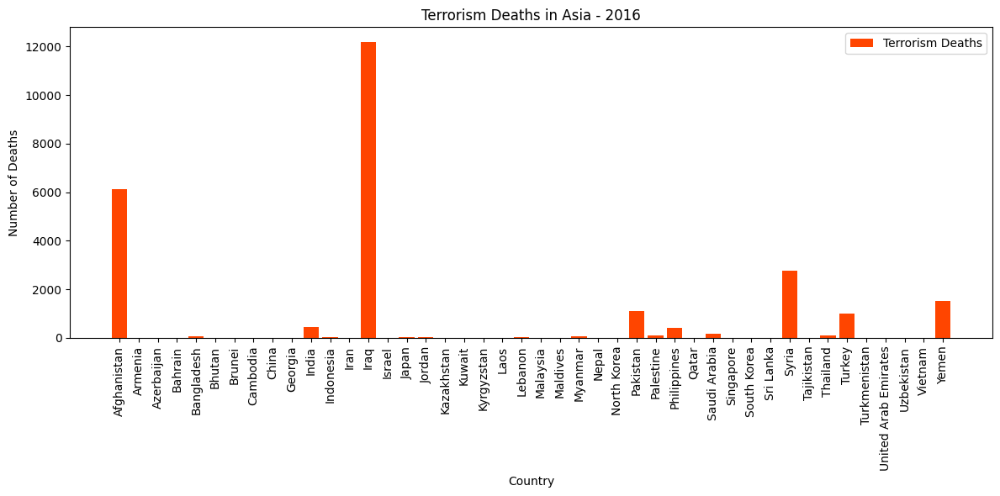

In [20]:
for year in range(1990, 2017):
    # Filter data for the current year
    df_year = df_asia[df_asia['Year'] == year]

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(df_year['Entity'], df_year['Terrorism (deaths)'], label='Terrorism Deaths', color='orangered')
    plt.xlabel('Country')
    plt.ylabel('Number of Deaths')
    plt.title(f'Terrorism Deaths in Asia - {year}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

## Europe

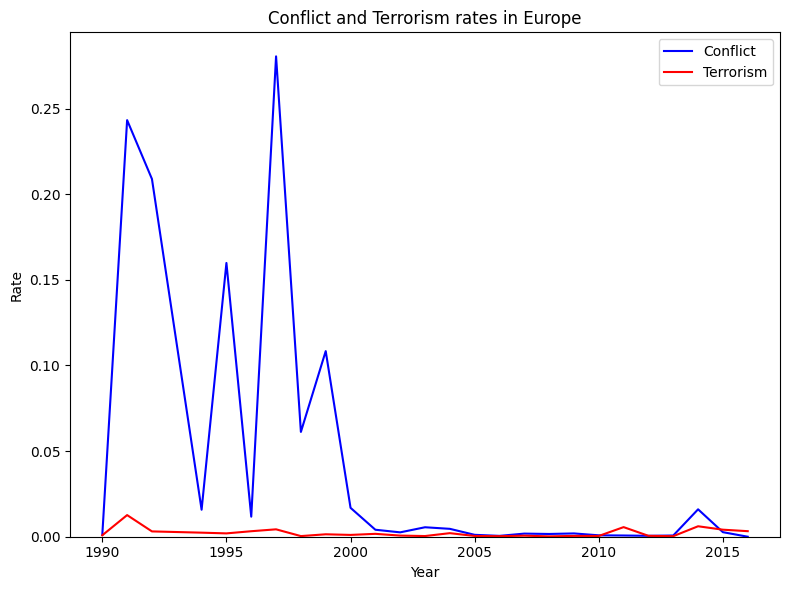

In [21]:
# Group data by year and calculate mean conflict and terrorism rates for Europe
df_europe = df[df['Continent'] == 'Europe']
conflict_and_terrorism_europe = df_europe.groupby('Year').mean(numeric_only=True)


# Plot both trend lines on the same graph
plt.figure(figsize=(8, 6))
plt.plot(conflict_and_terrorism_europe.index, conflict_and_terrorism_europe['Conflict (percent)'], color='blue', label='Conflict')
plt.plot(conflict_and_terrorism_europe.index, conflict_and_terrorism_europe['Terrorism (percent)'], color='red', label='Terrorism')
plt.title('Conflict and Terrorism rates in Europe')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.legend()

# Set the y-axis to start from 0
plt.ylim(0)

plt.tight_layout()
plt.show()

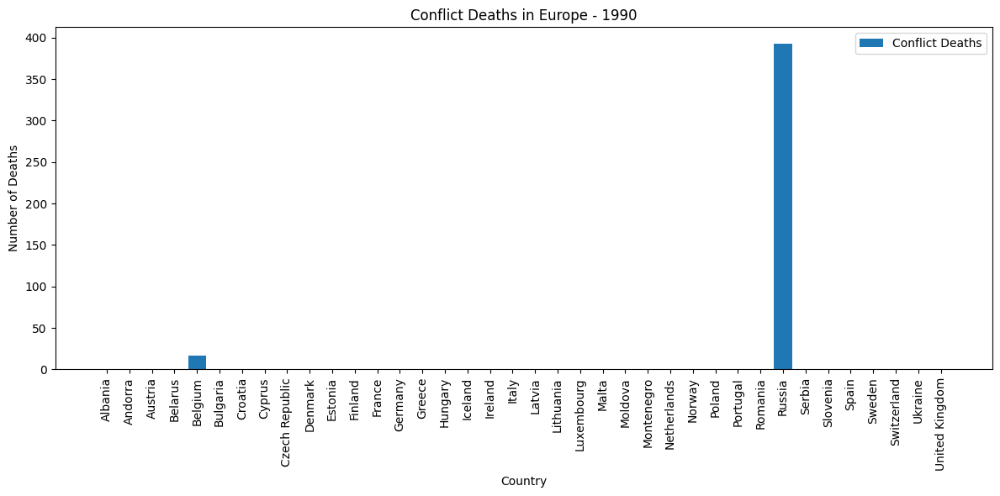

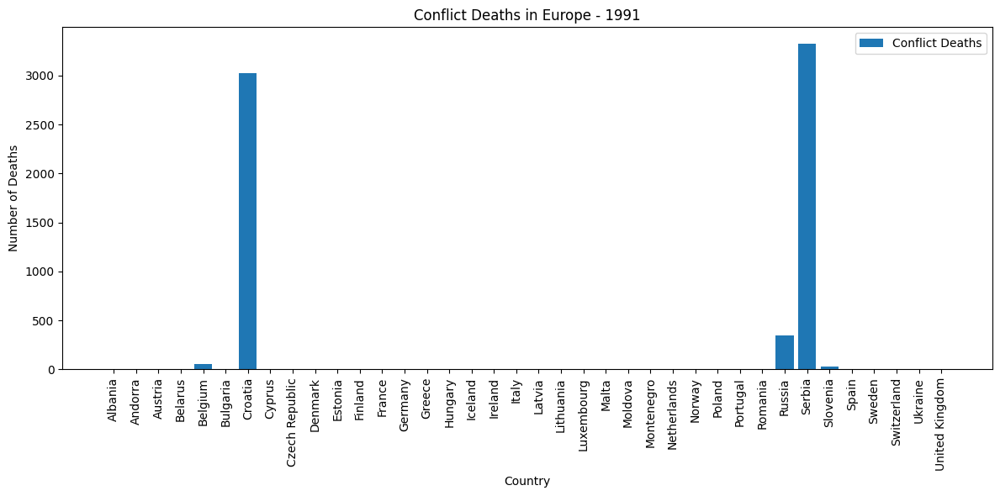

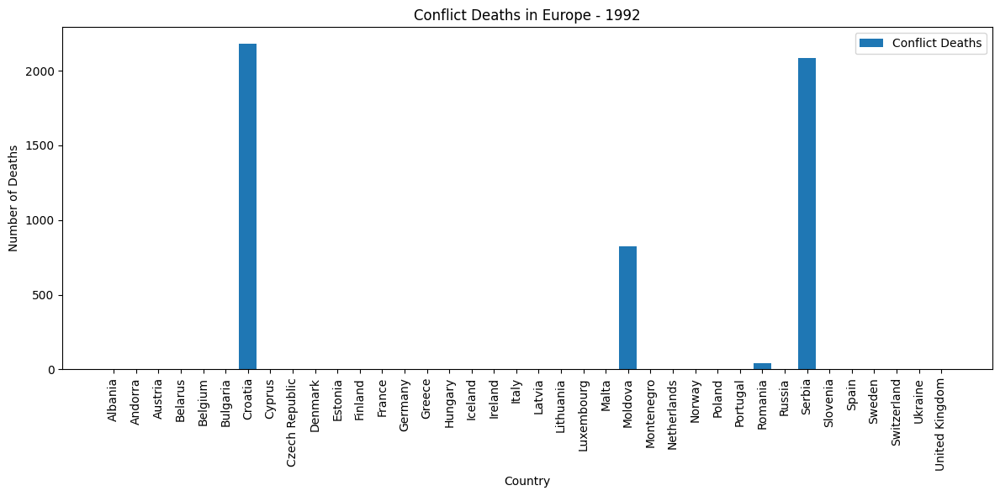

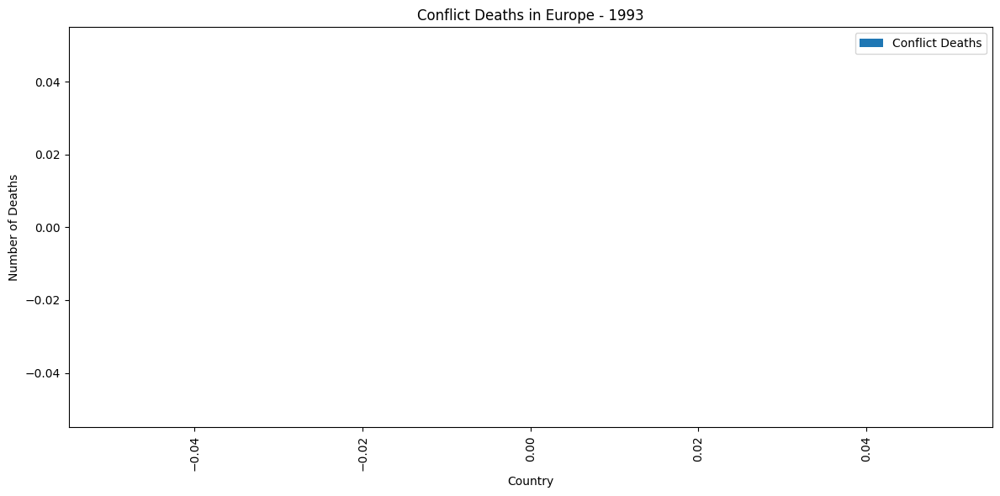

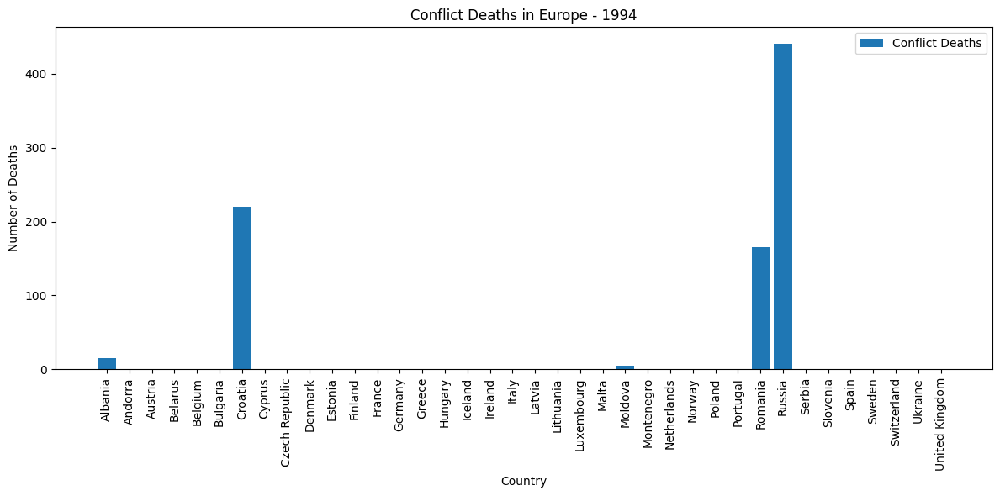

...

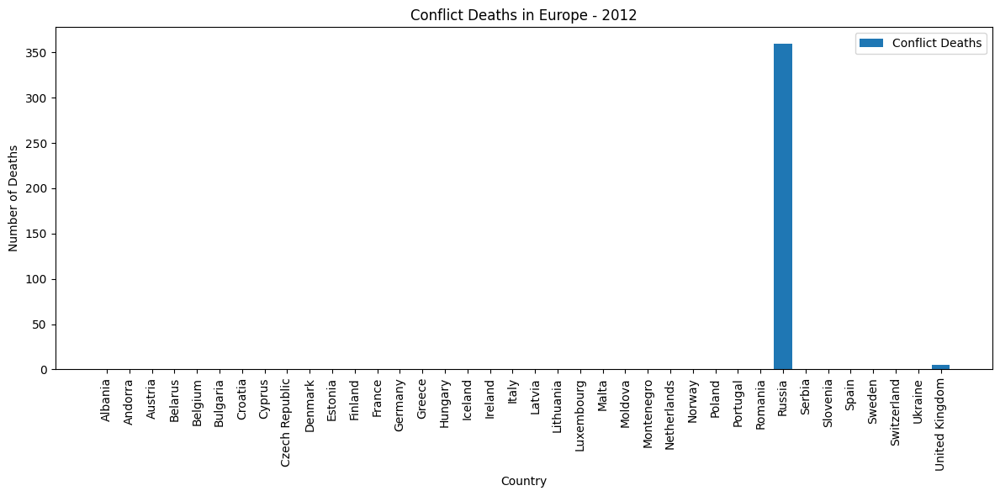

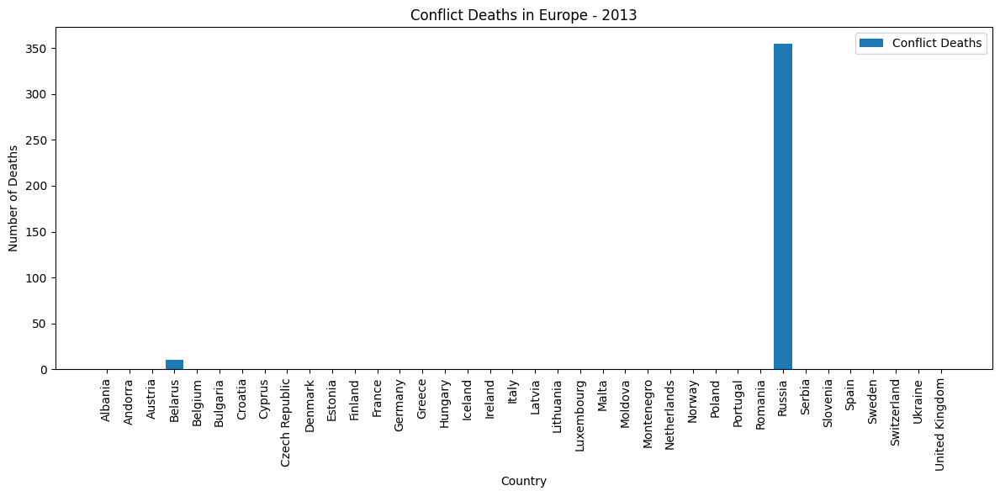

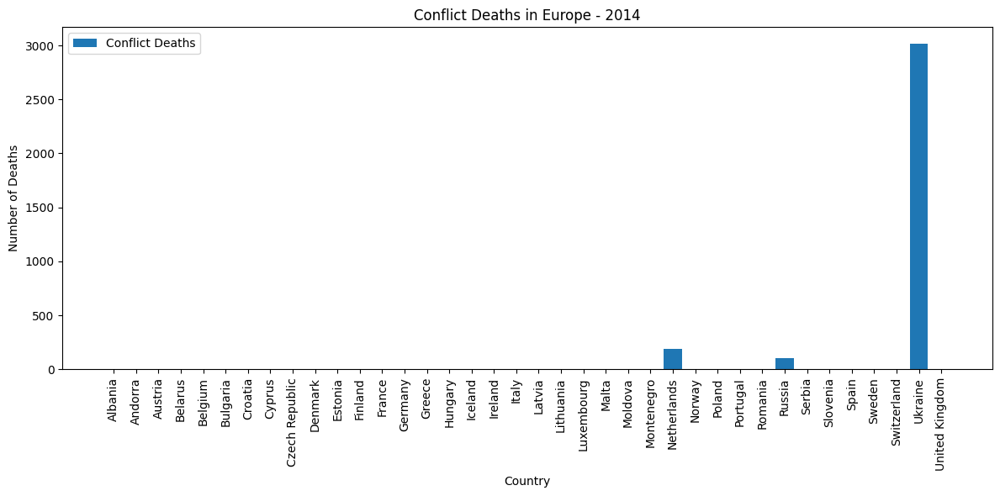

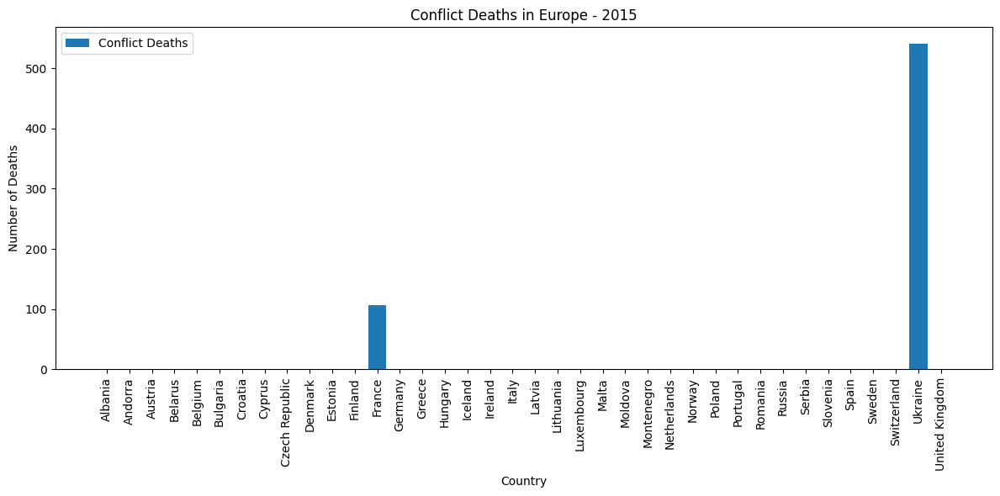

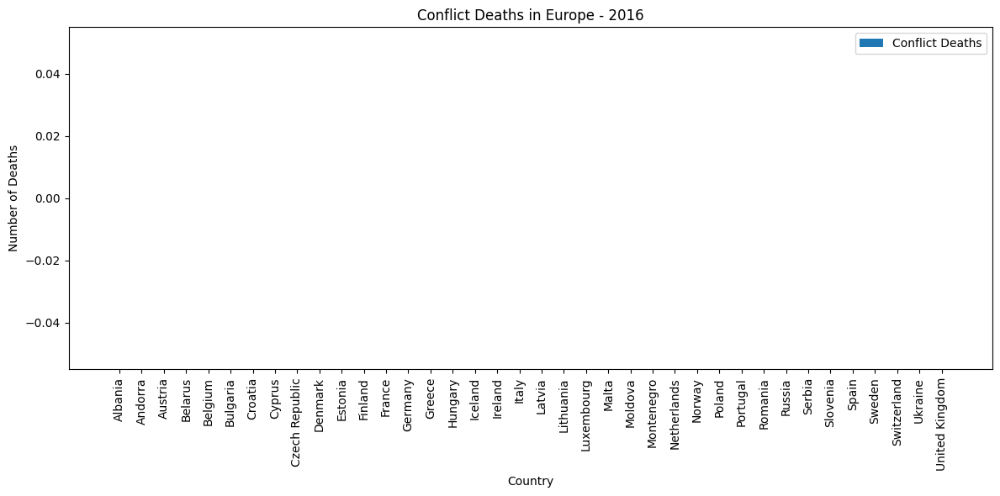

In [22]:
# Iterate through each year from 1990 to 2016
for year in range(1990, 2017):
    # Filter data for the current year
    df_year = df_europe[df_europe['Year'] == year]

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(df_year['Entity'], df_year['Conflict (deaths)'], label='Conflict Deaths')
    plt.xlabel('Country')
    plt.ylabel('Number of Deaths')
    plt.title(f'Conflict Deaths in Europe - {year}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

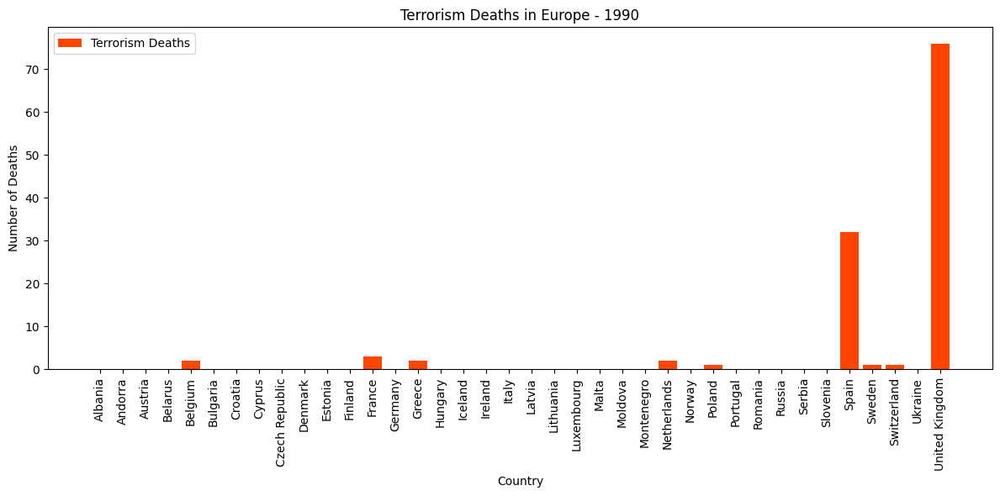

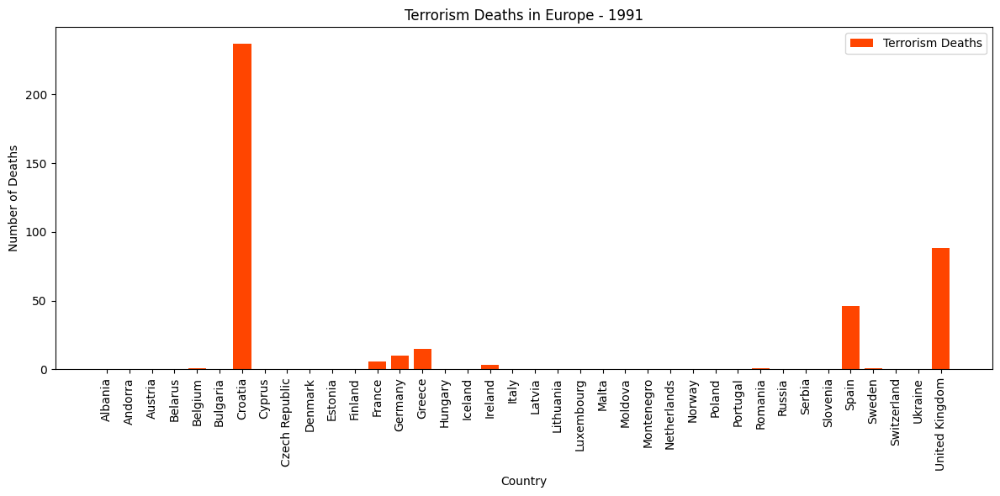

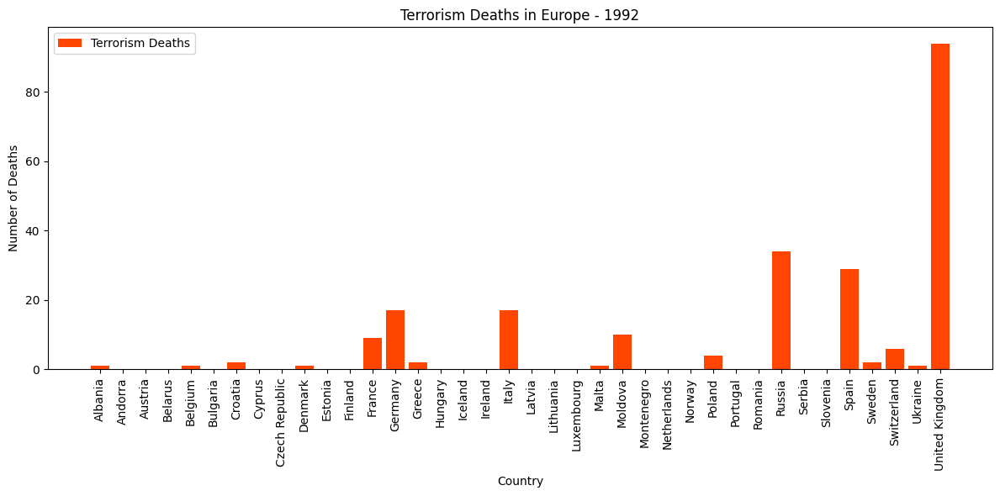

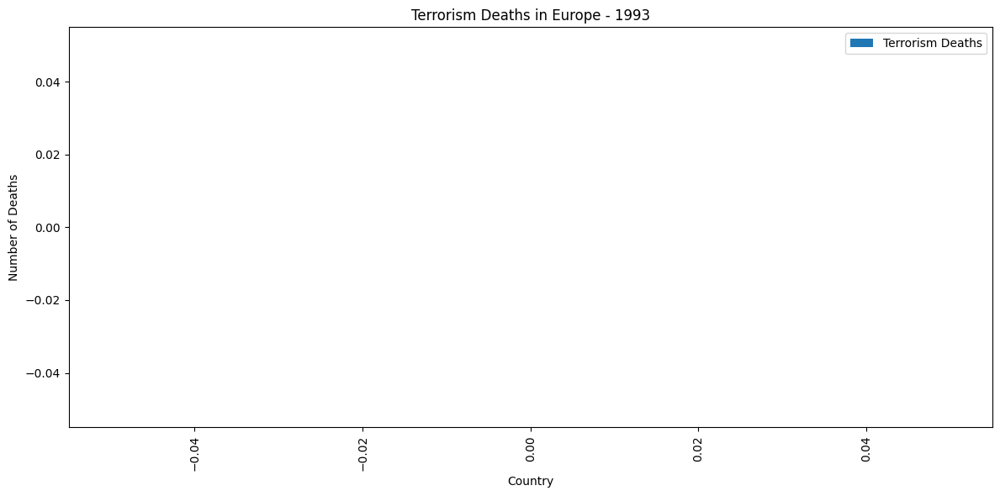

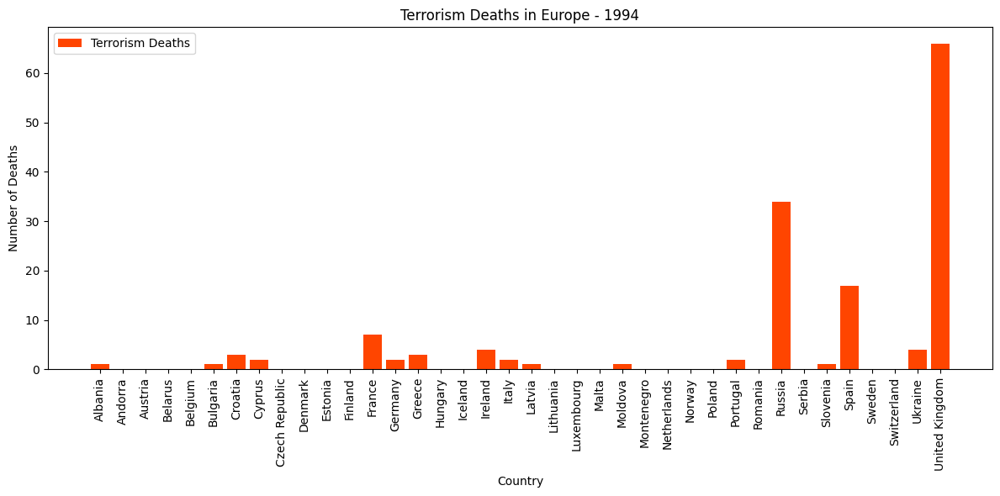

...

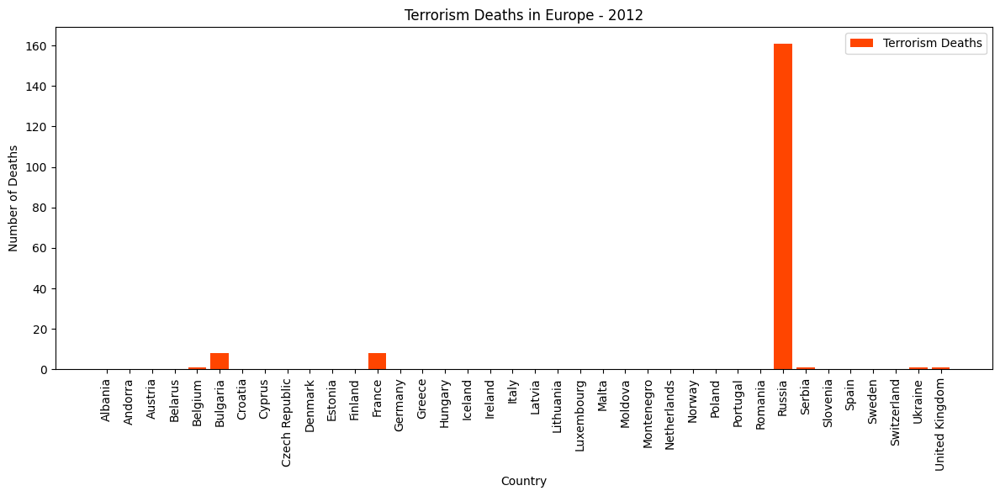

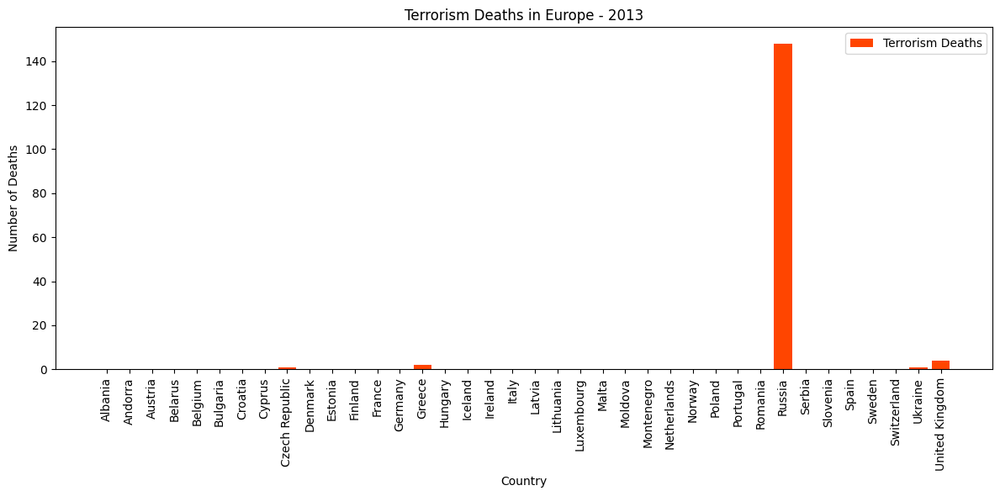

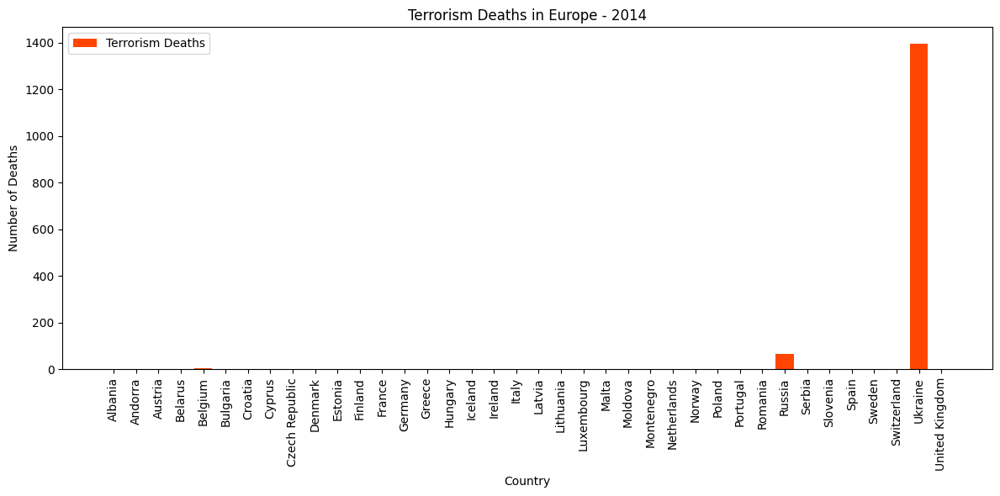

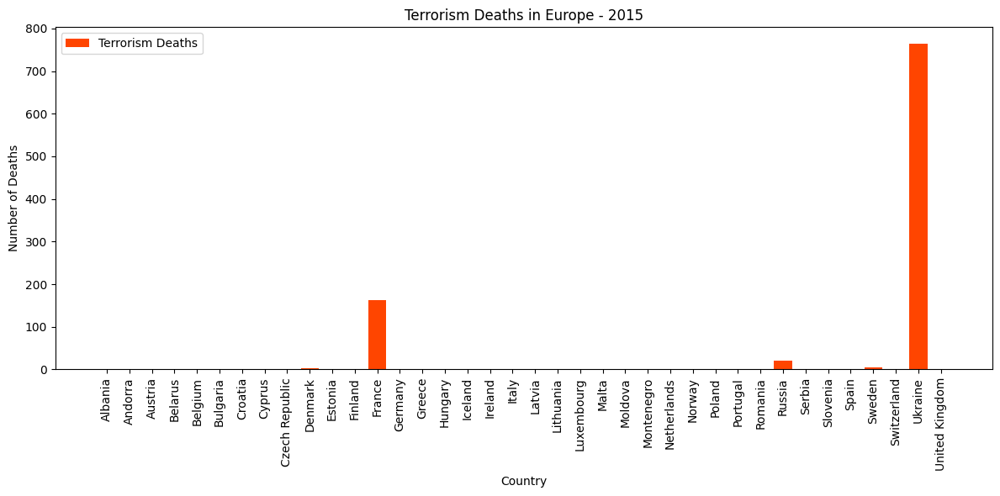

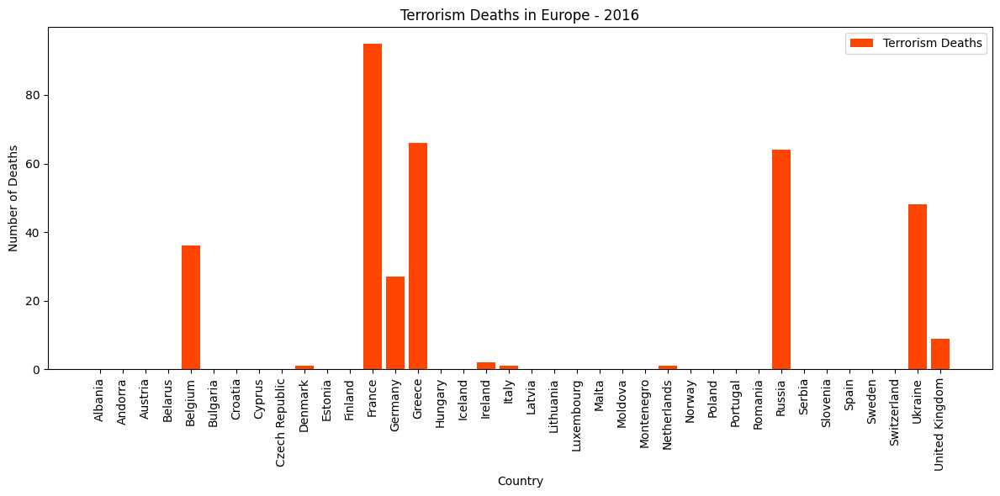

In [23]:
# Iterate through each year from 1990 to 2016
for year in range(1990, 2017):
    # Filter data for the current year
    df_year = df_europe[df_europe['Year'] == year]

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(df_year['Entity'], df_year['Terrorism (deaths)'], label='Terrorism Deaths', color='orangered')
    plt.xlabel('Country')
    plt.ylabel('Number of Deaths')
    plt.title(f'Terrorism Deaths in Europe - {year}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

## North America

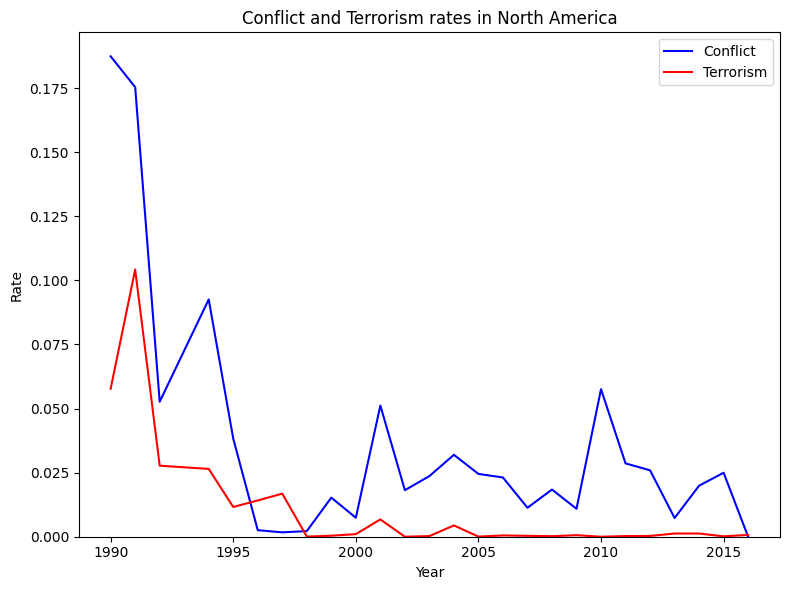

In [24]:
# Group data by year and calculate mean conflict and terrorism rates for North America
df_north_america = df[df['Continent'] == 'North America']
conflict_and_terrorism_north_america = df_north_america.groupby('Year').mean(numeric_only=True)


# Plot both trend lines on the same graph
plt.figure(figsize=(8, 6))
plt.plot(conflict_and_terrorism_north_america.index, conflict_and_terrorism_north_america['Conflict (percent)'], color='blue', label='Conflict')
plt.plot(conflict_and_terrorism_north_america.index, conflict_and_terrorism_north_america['Terrorism (percent)'], color='red', label='Terrorism')
plt.title('Conflict and Terrorism rates in North America')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.legend()

# Set the y-axis to start from 0
plt.ylim(0)

plt.tight_layout()
plt.show()

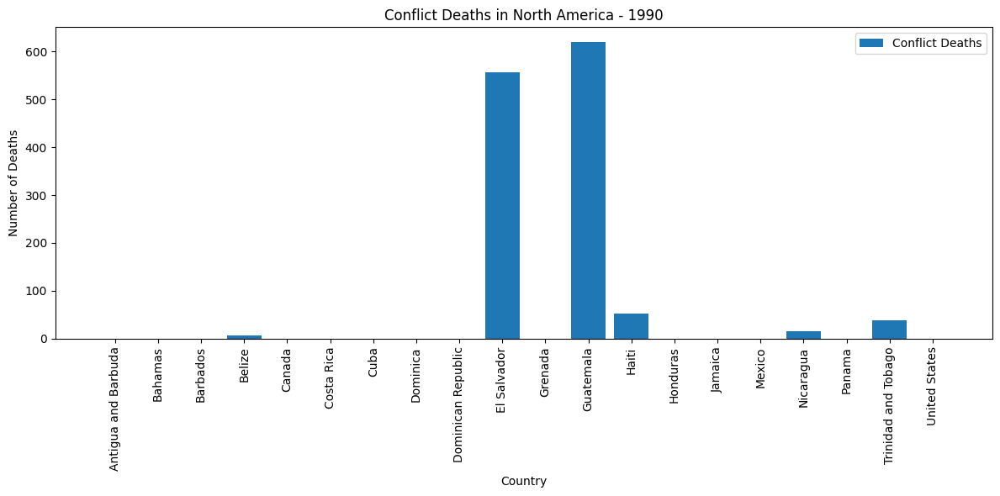

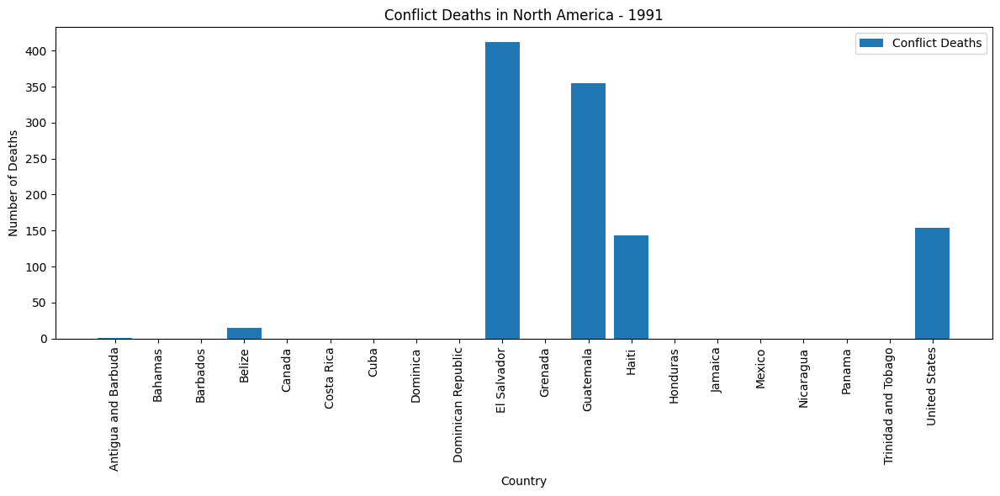

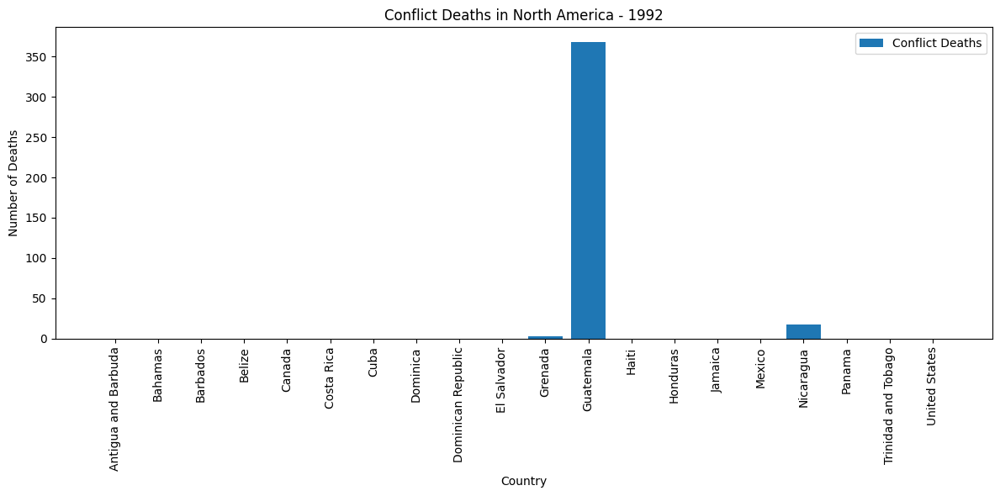

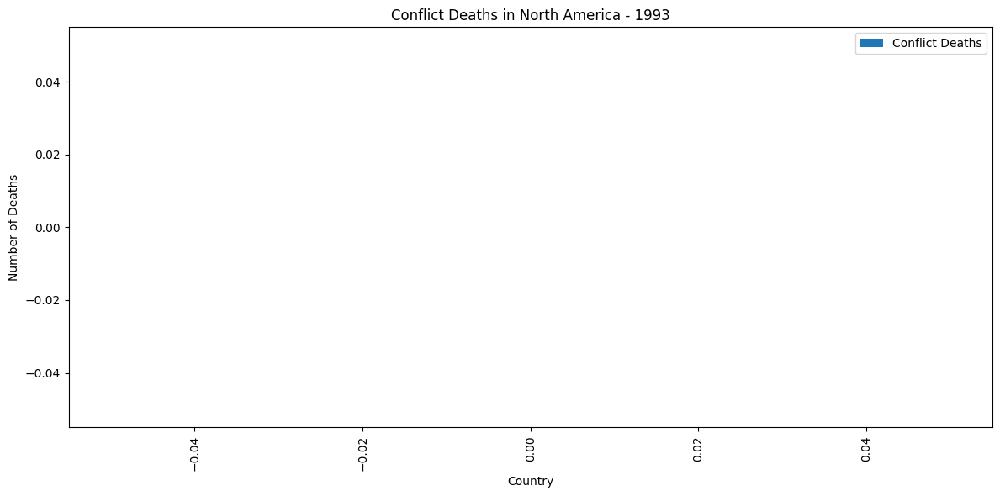

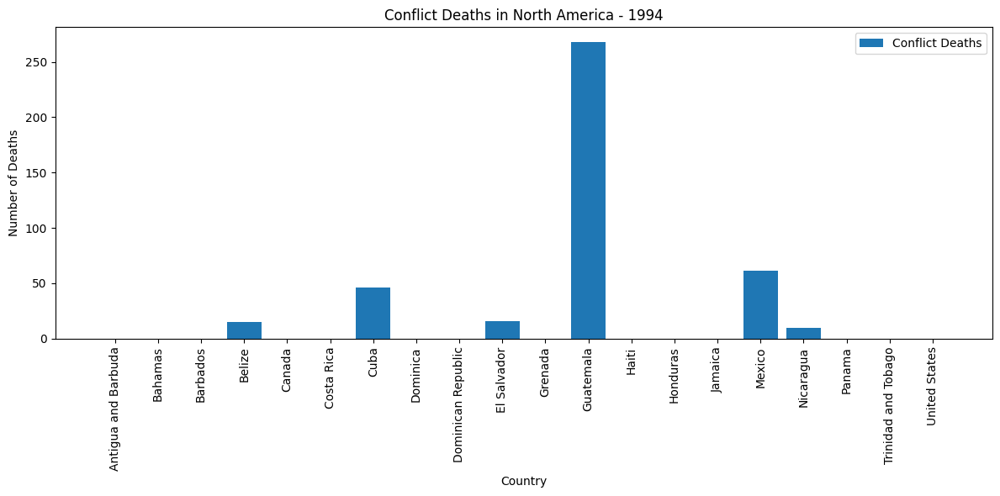

...

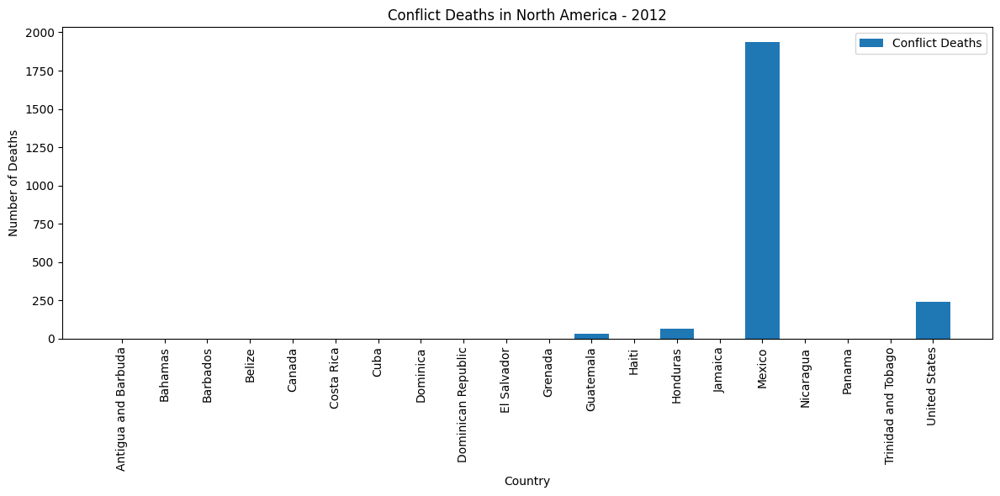

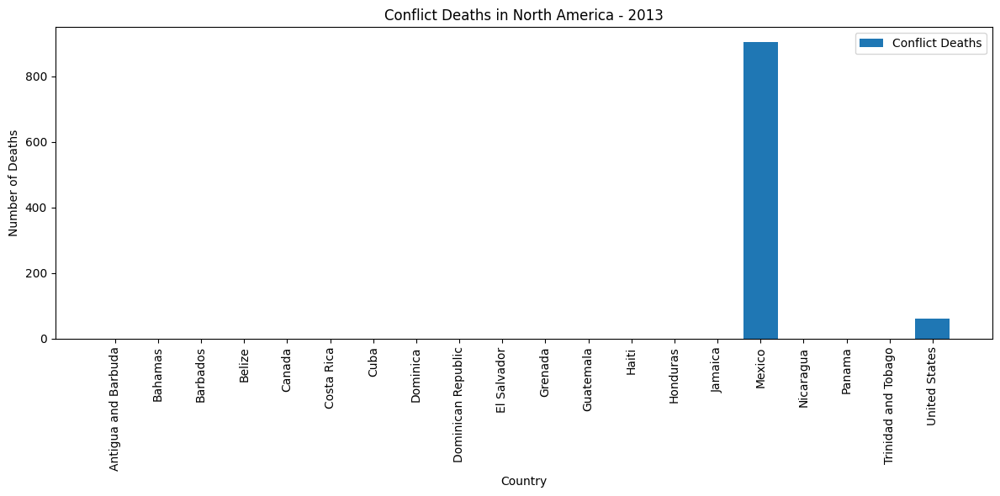

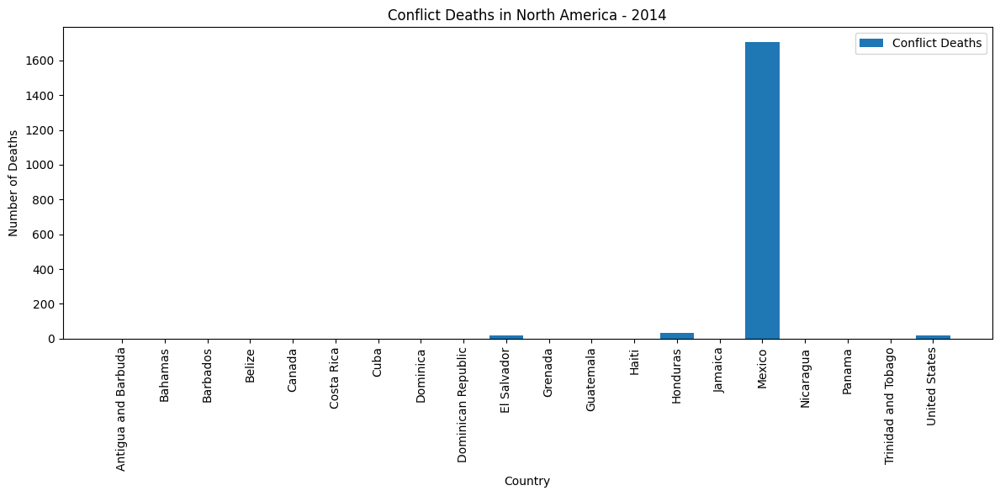

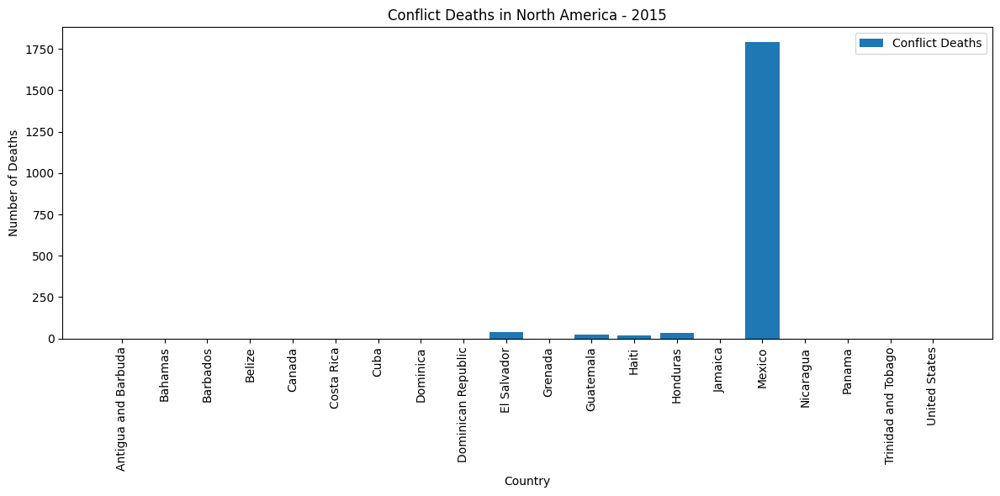

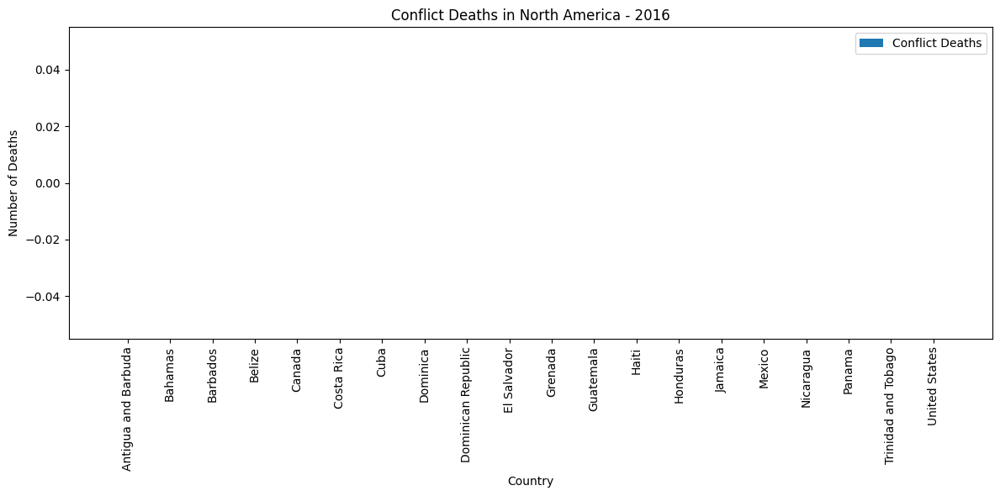

In [25]:
# Iterate through each year from 1990 to 2016
for year in range(1990, 2017):
    # Filter data for the current year
    df_year = df_north_america[df_north_america['Year'] == year]

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(df_year['Entity'], df_year['Conflict (deaths)'], label='Conflict Deaths')
    plt.xlabel('Country')
    plt.ylabel('Number of Deaths')
    plt.title(f'Conflict Deaths in North America - {year}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

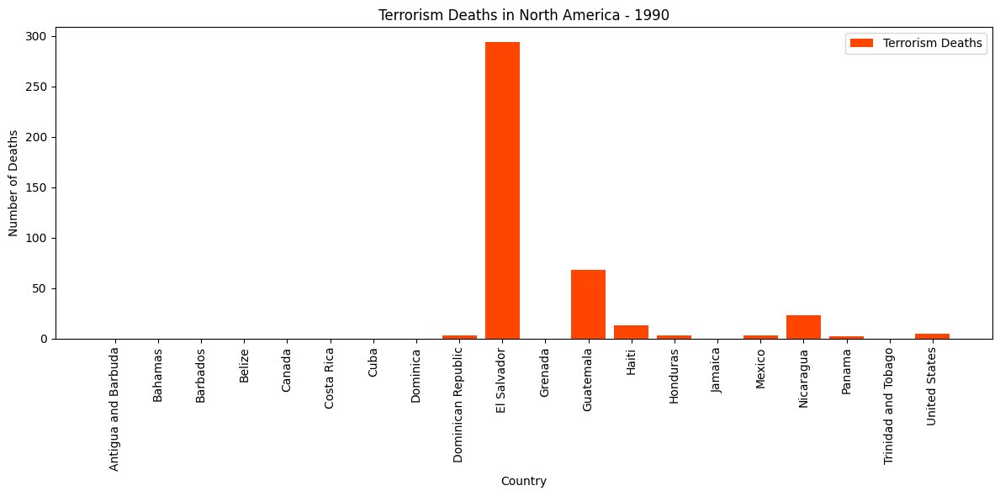

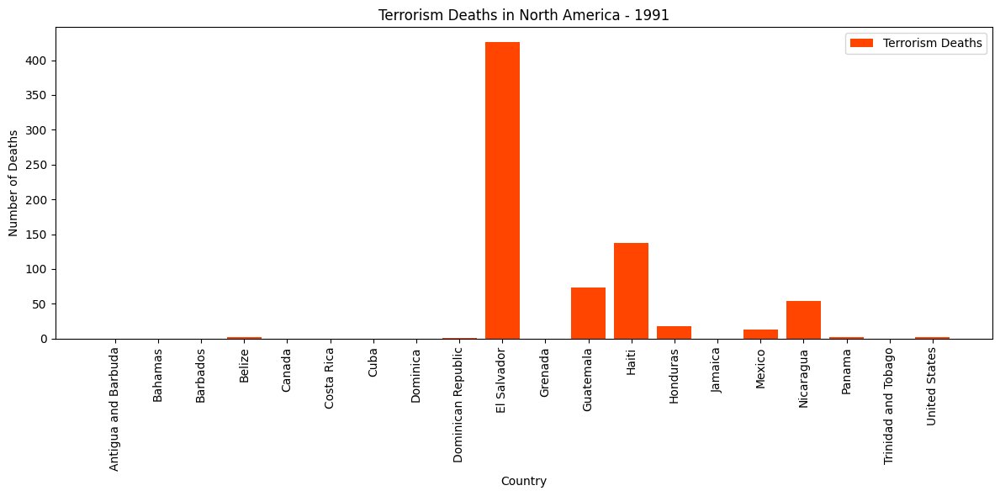

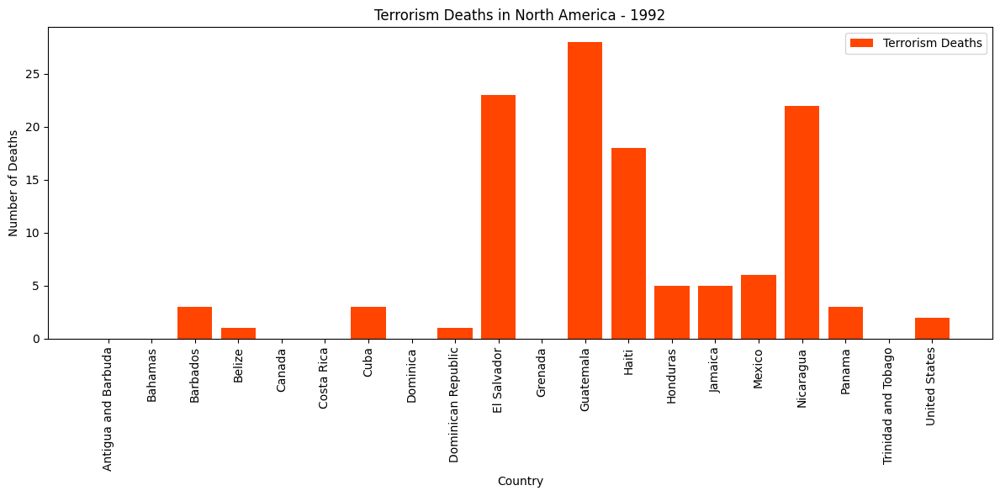

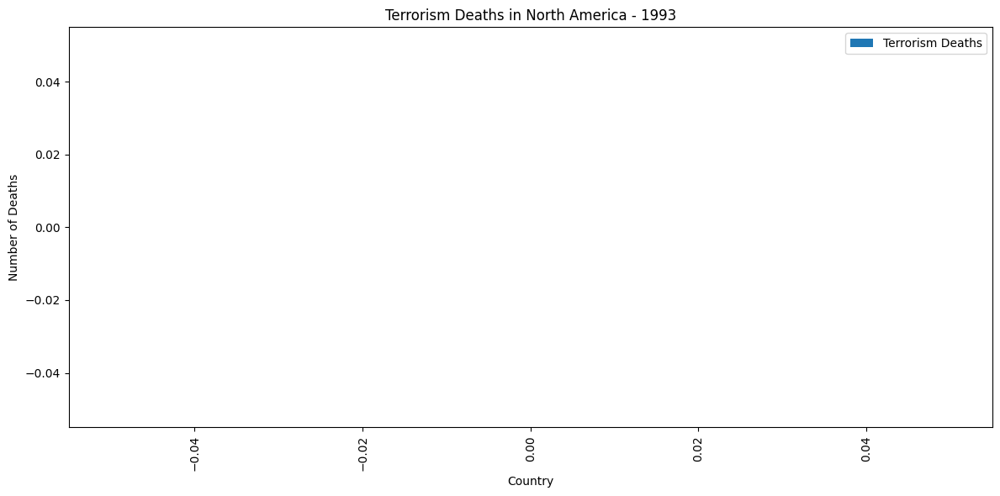

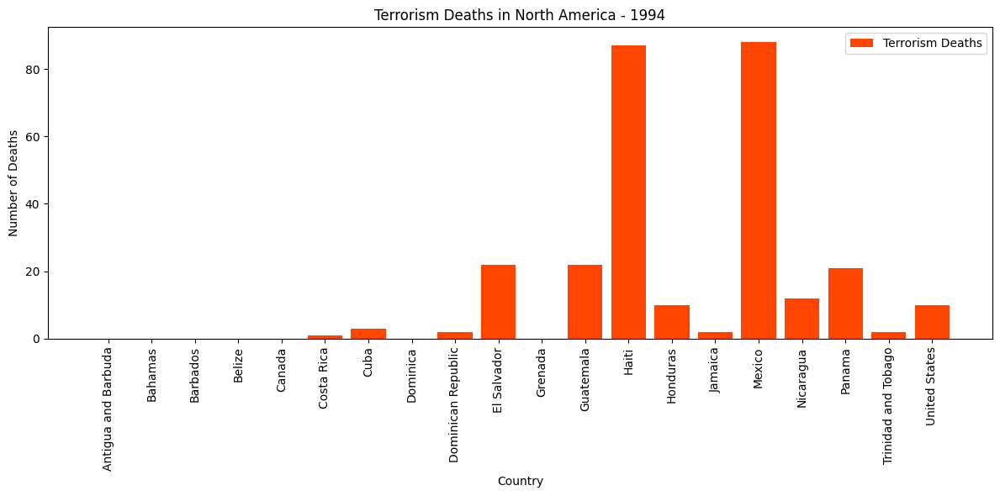

...

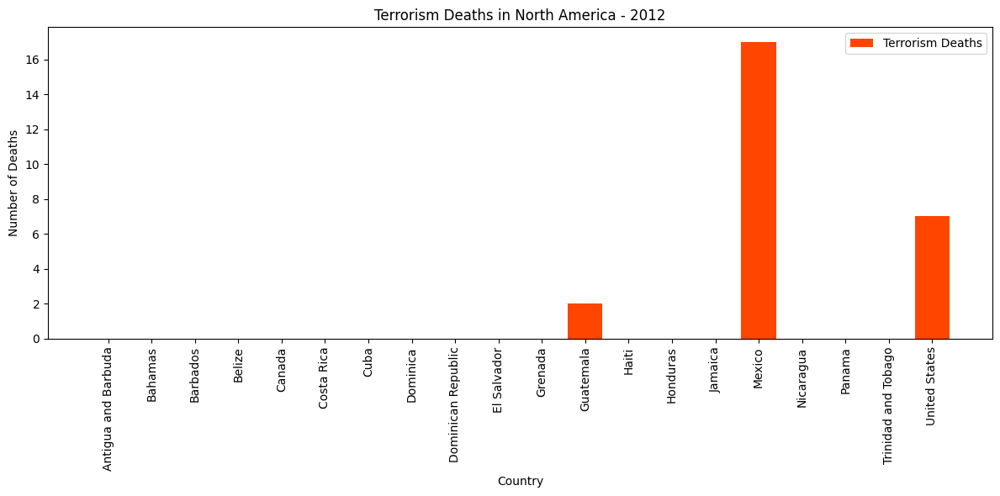

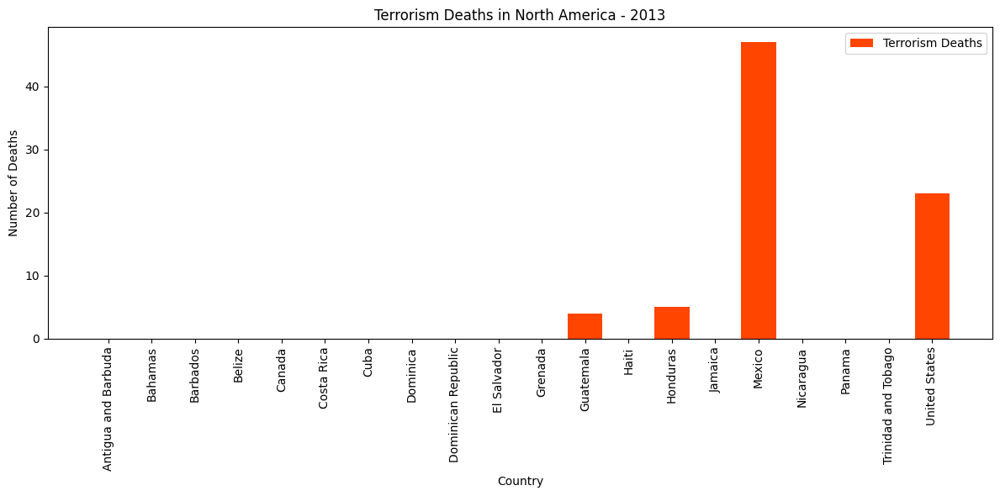

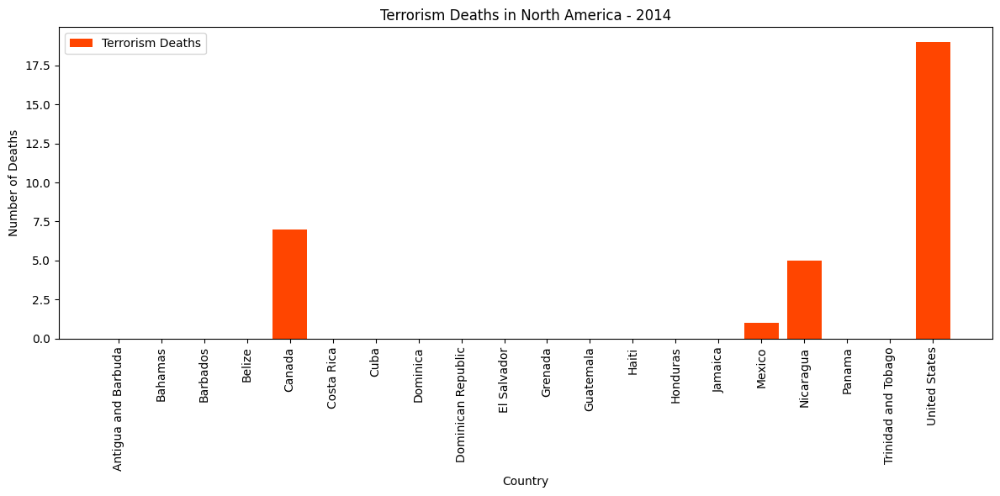

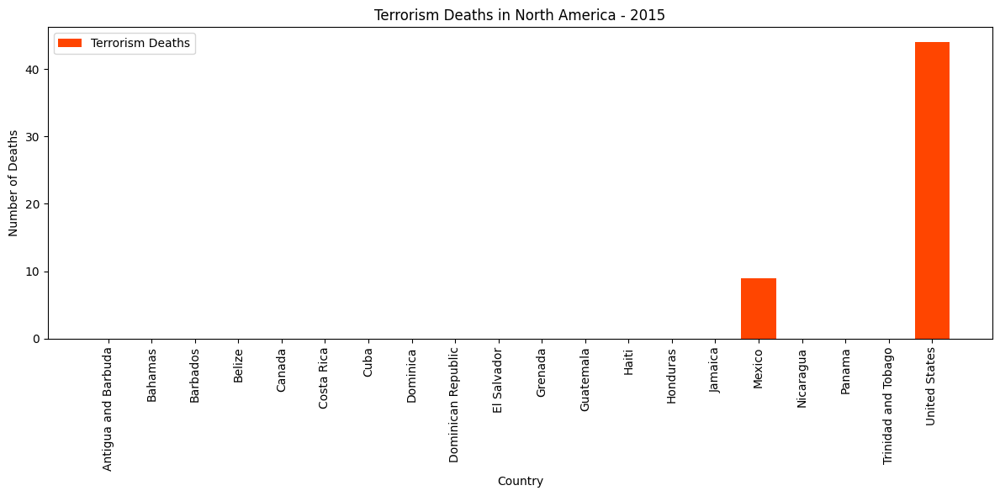

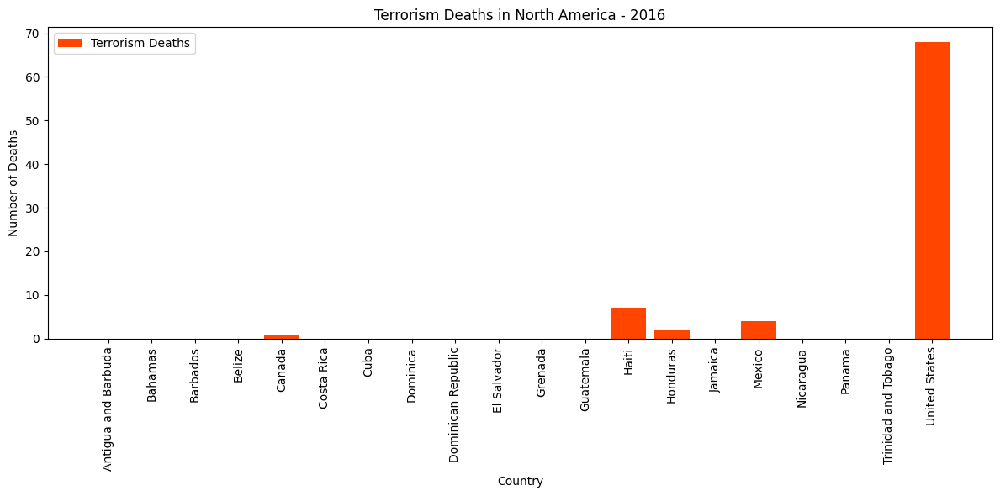

In [26]:
# Iterate through each year from 1990 to 2016
for year in range(1990, 2017):
    # Filter data for the current year
    df_year = df_north_america[df_north_america['Year'] == year]

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(df_year['Entity'], df_year['Terrorism (deaths)'], label='Terrorism Deaths', color='orangered')
    plt.xlabel('Country')
    plt.ylabel('Number of Deaths')
    plt.title(f'Terrorism Deaths in North America - {year}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

## Oceania

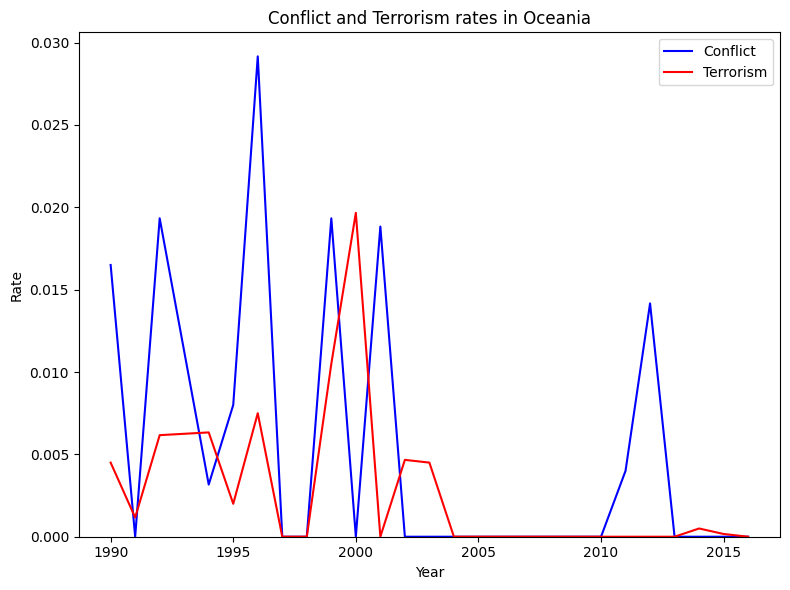

In [27]:
# Group data by year and calculate mean conflict and terrorism rates for Oceania
df_oceania = df[df['Continent'] == 'Oceania']
conflict_and_terrorism_oceania = df_oceania.groupby('Year').mean(numeric_only=True)


# Plot both trend lines on the same graph
plt.figure(figsize=(8, 6))
plt.plot(conflict_and_terrorism_oceania.index, conflict_and_terrorism_oceania['Conflict (percent)'], color='blue', label='Conflict')
plt.plot(conflict_and_terrorism_oceania.index, conflict_and_terrorism_oceania['Terrorism (percent)'], color='red', label='Terrorism')
plt.title('Conflict and Terrorism rates in Oceania')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.legend()

# Set the y-axis to start from 0
plt.ylim(0)

plt.tight_layout()
plt.show()

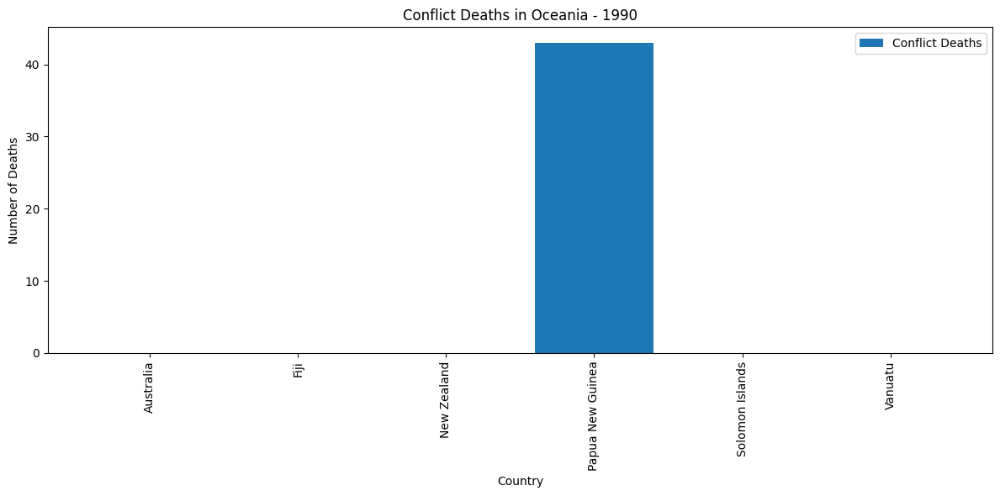

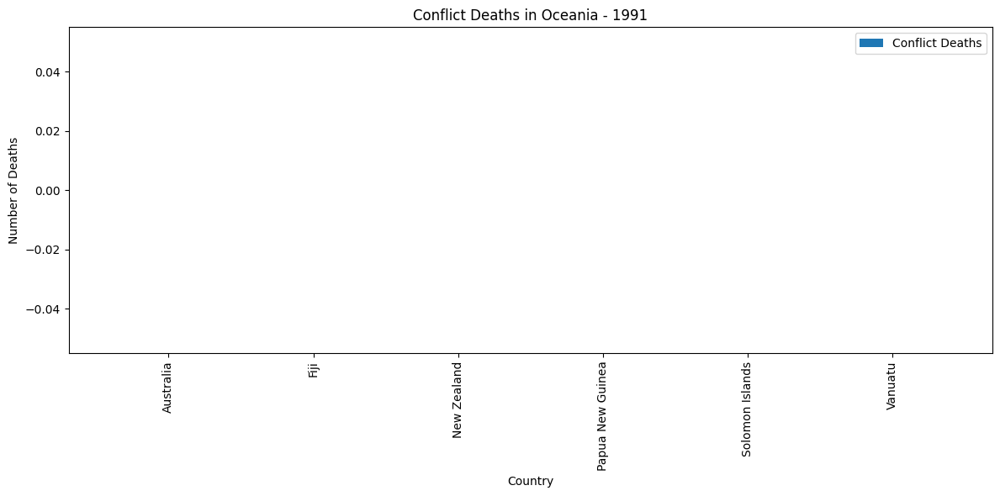

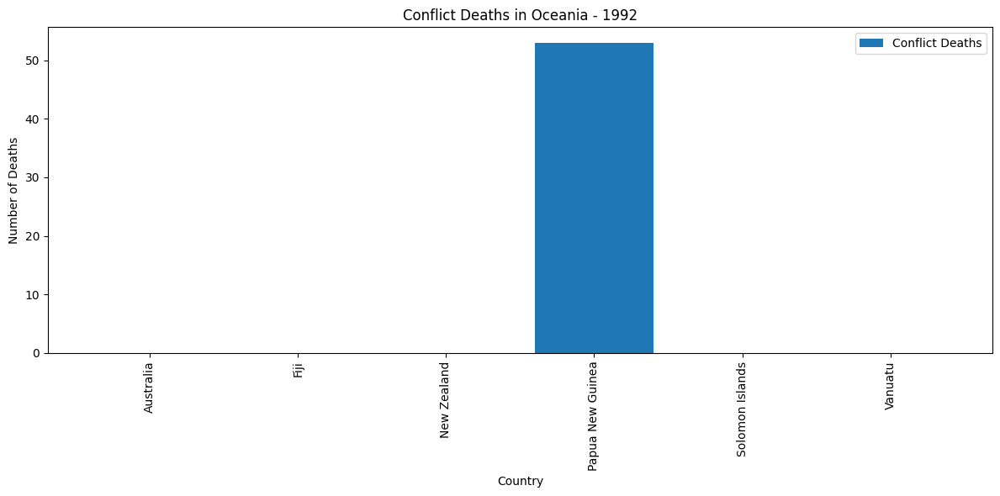

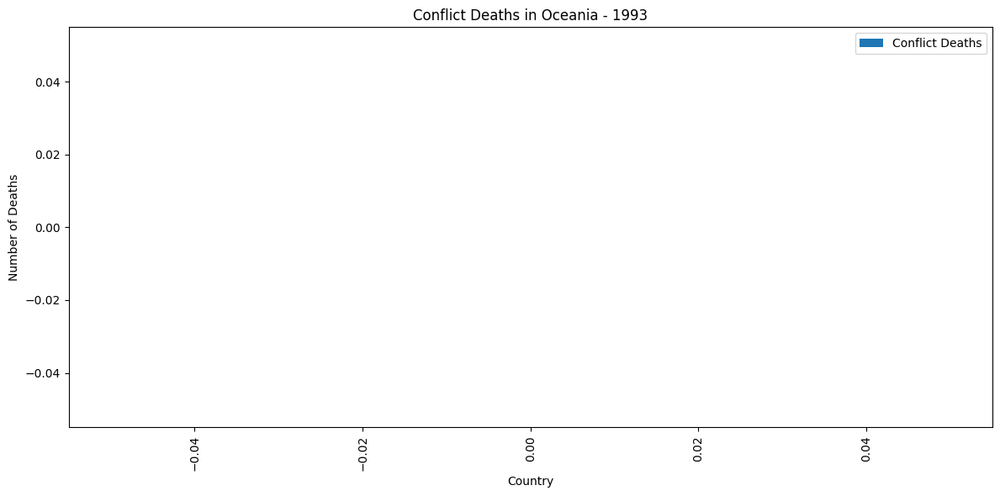

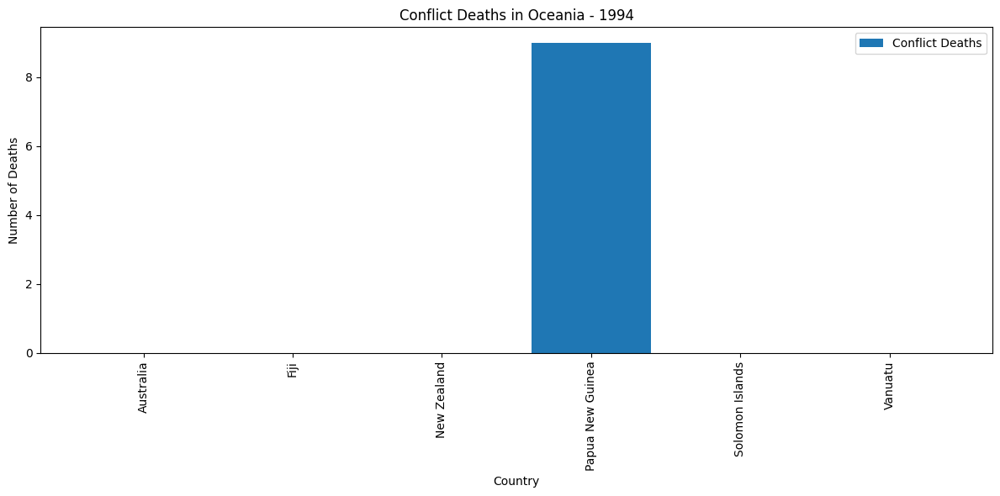

...

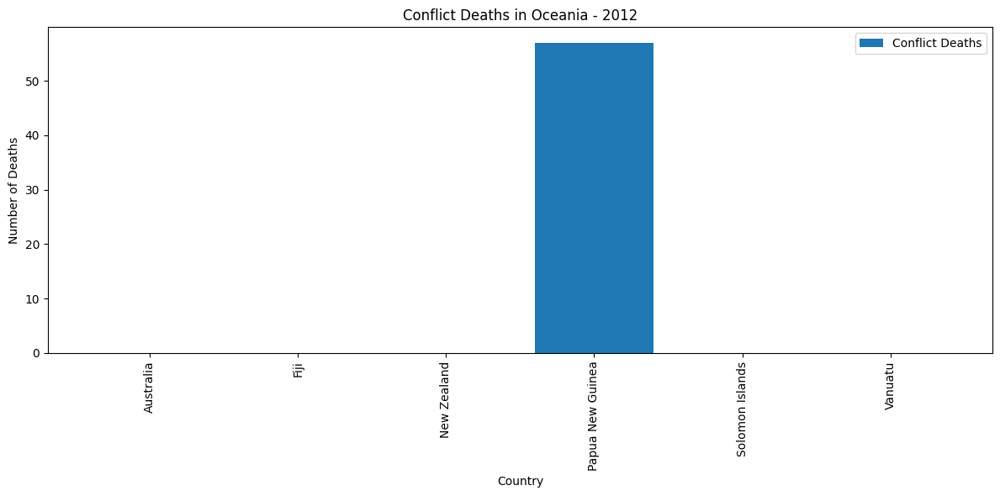

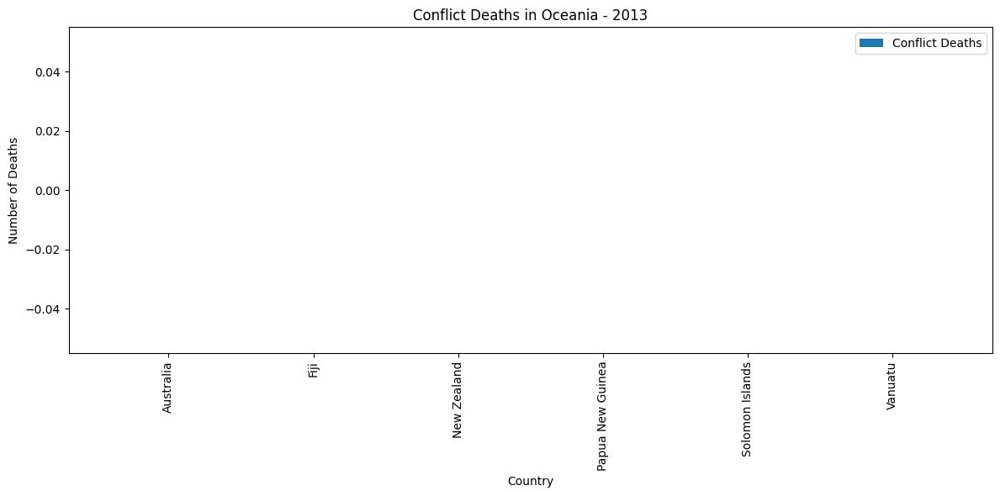

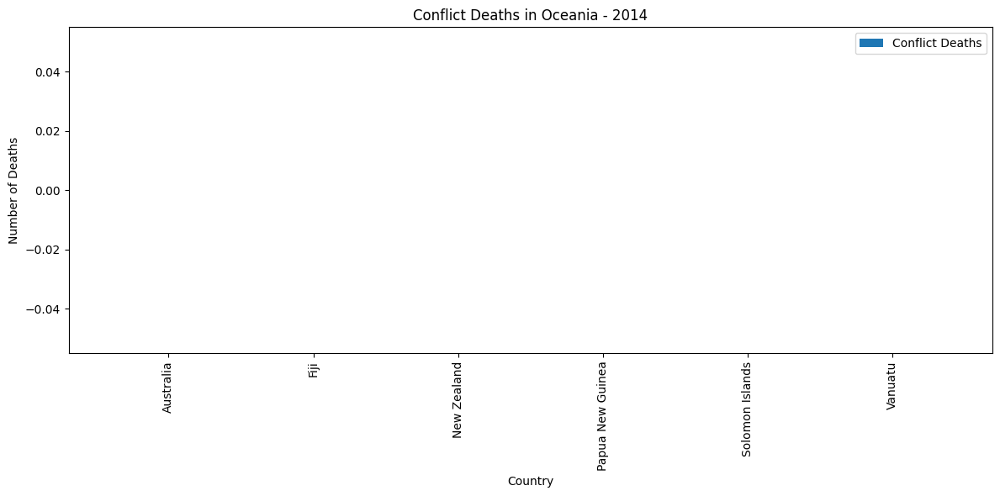

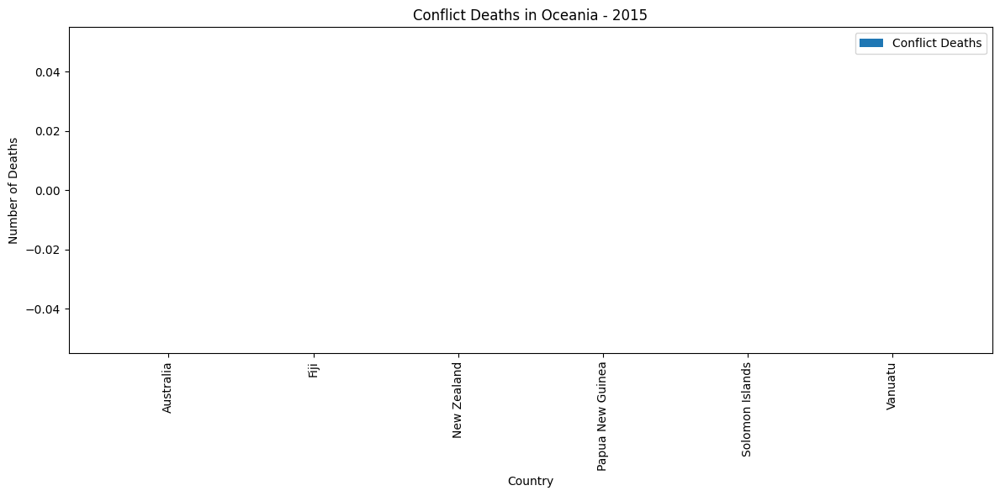

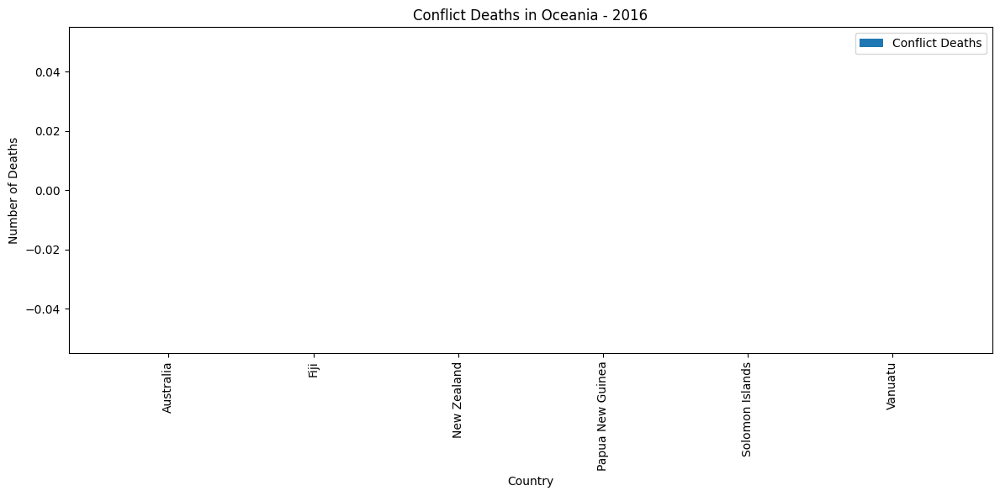

In [28]:
# Iterate through each year from 1990 to 2016
for year in range(1990, 2017):
    # Filter data for the current year
    df_year = df_oceania[df_oceania['Year'] == year]

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(df_year['Entity'], df_year['Conflict (deaths)'], label='Conflict Deaths')
    plt.xlabel('Country')
    plt.ylabel('Number of Deaths')
    plt.title(f'Conflict Deaths in Oceania - {year}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

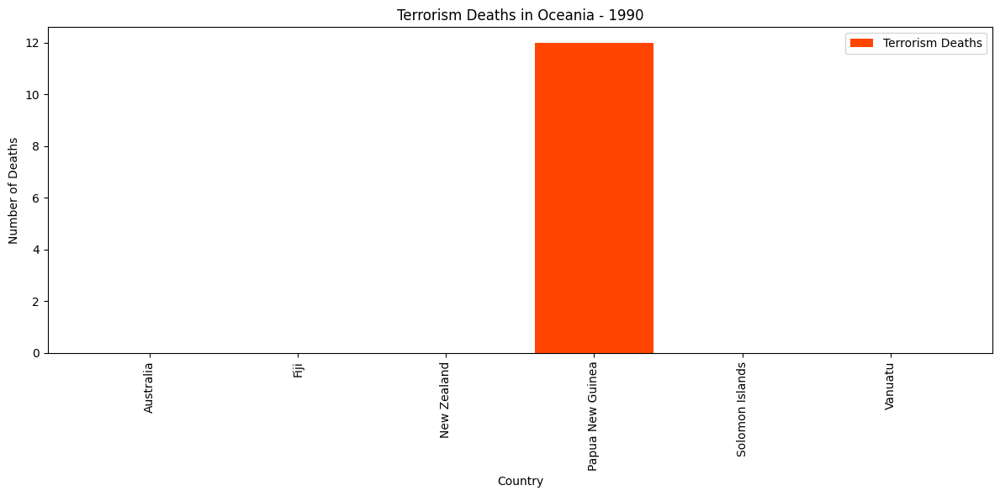

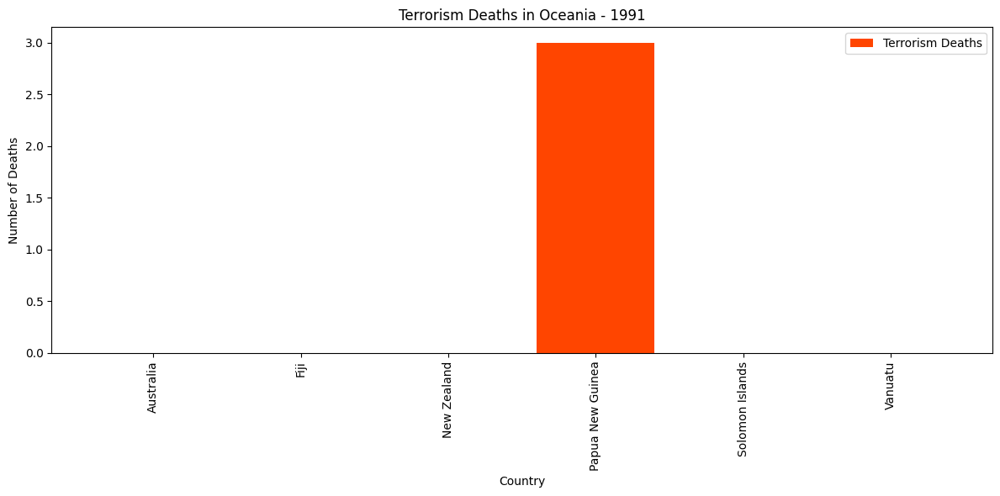

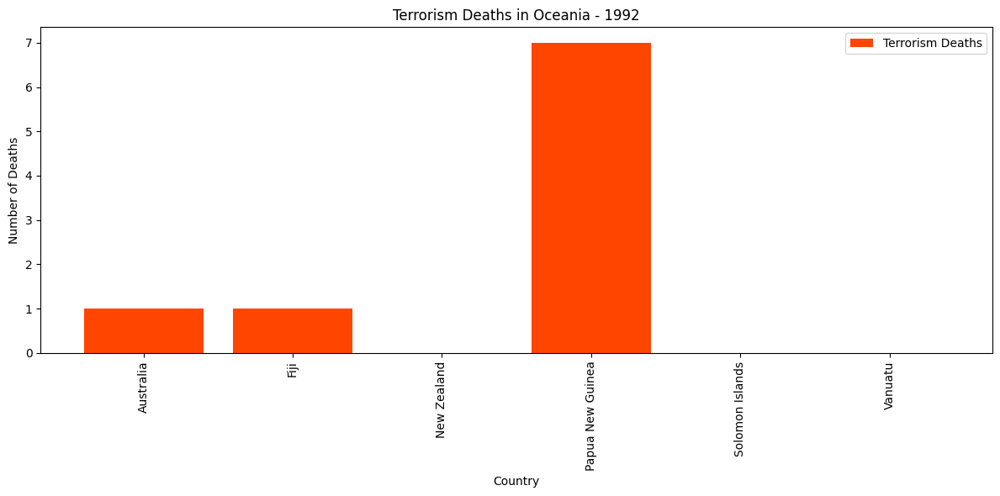

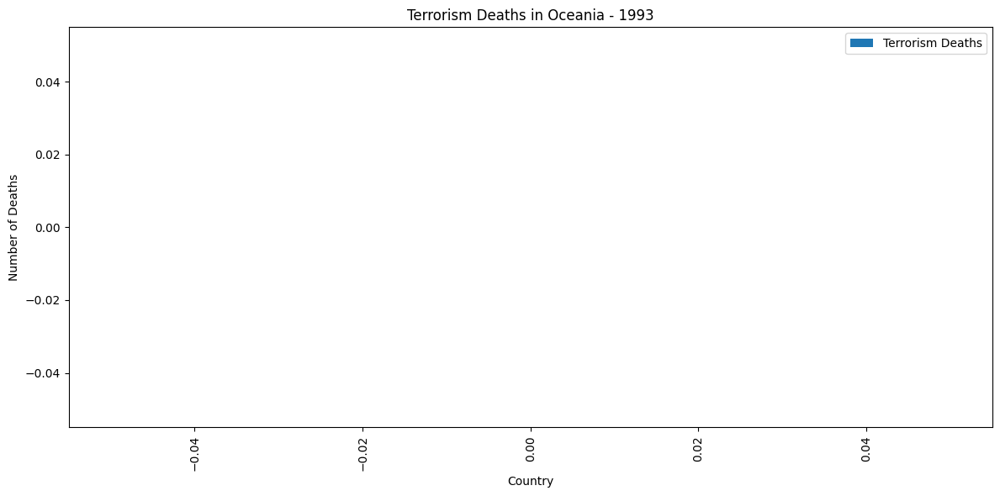

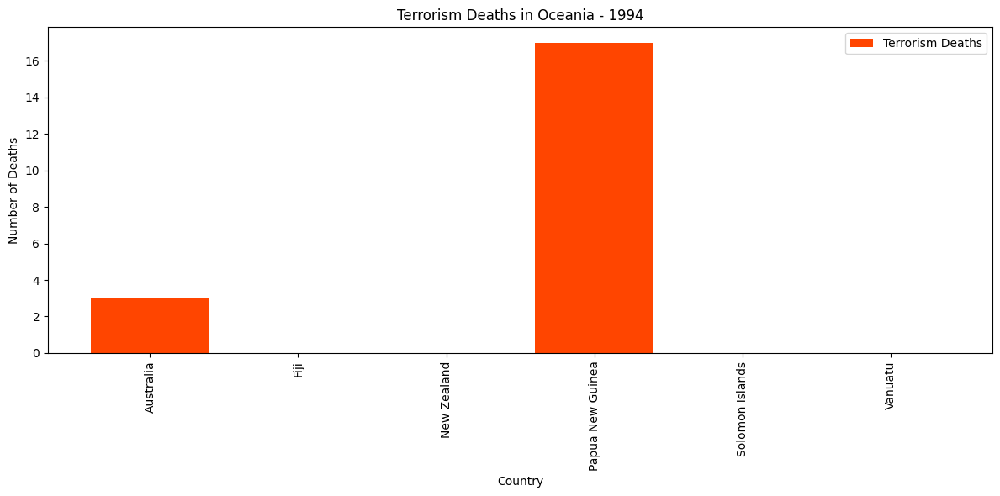

...

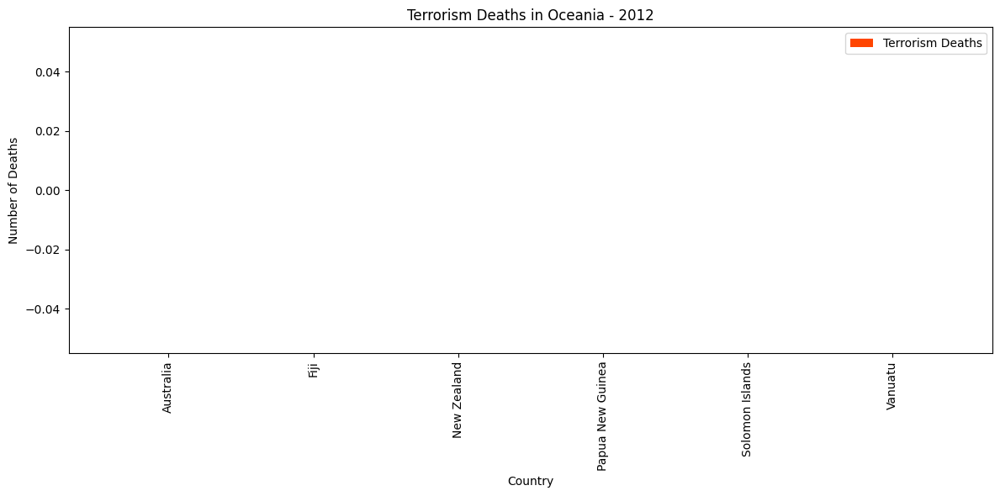

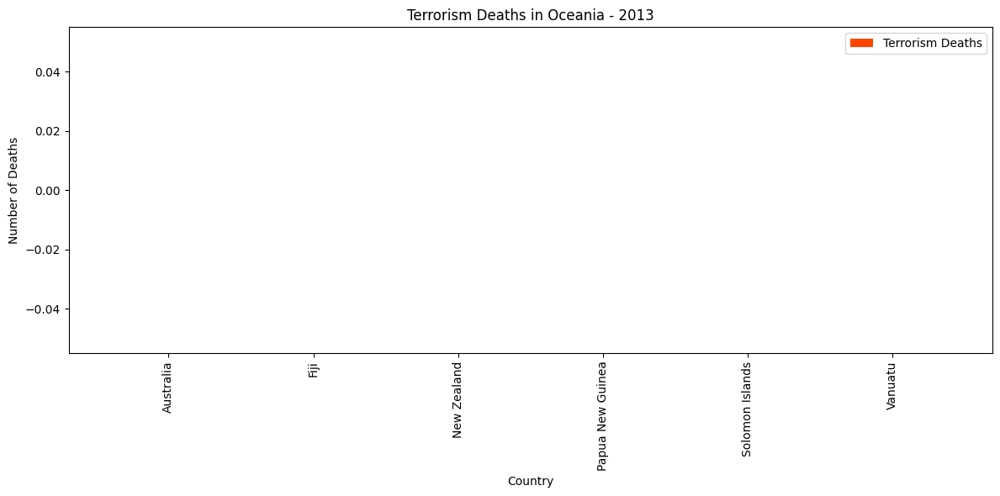

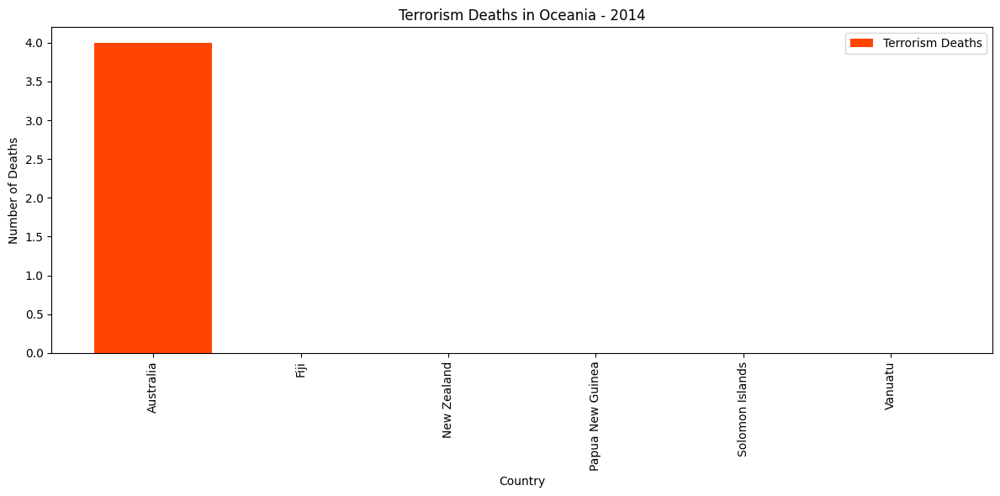

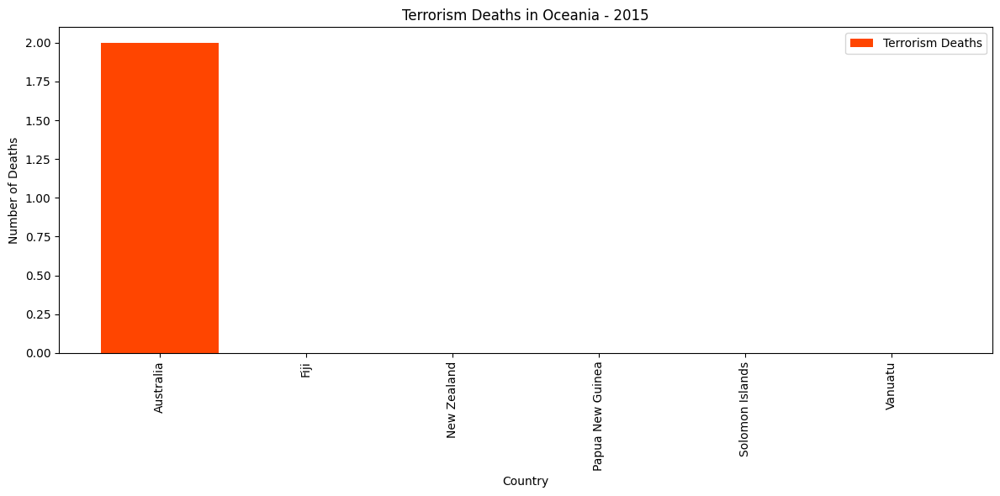

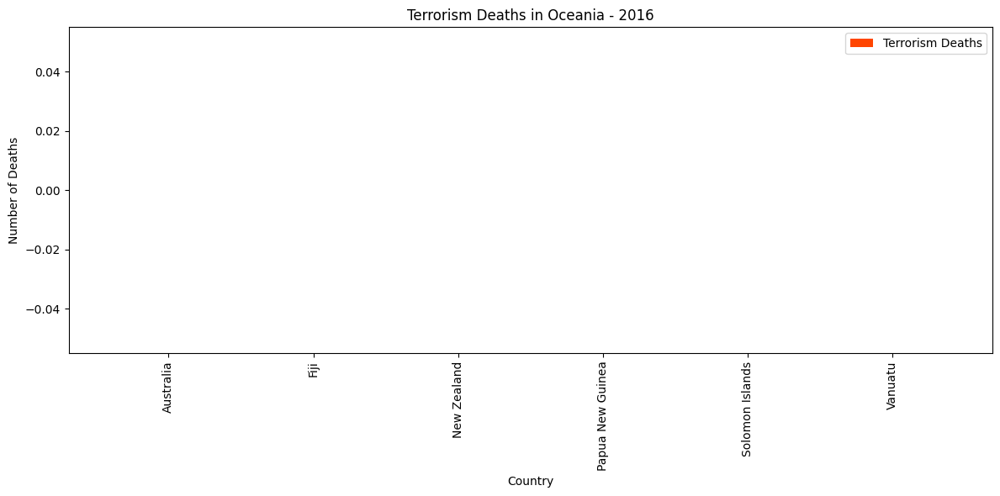

In [29]:
# Iterate through each year from 1990 to 2016
for year in range(1990, 2017):
    # Filter data for the current year
    df_year = df_oceania[df_oceania['Year'] == year]

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.bar(df_year['Entity'], df_year['Terrorism (deaths)'], label='Terrorism Deaths', color='orangered')
    plt.xlabel('Country')
    plt.ylabel('Number of Deaths')
    plt.title(f'Terrorism Deaths in Oceania - {year}')
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [30]:
# # Filter data for the year 2016 and Oceania
# df_2016_Oceania = df[(df['Year'] == 2016) & (df['Continent'] == 'Oceania')]

# # Plotting
# plt.figure(figsize=(12, 6))
# plt.bar(df_2016_Oceania['Entity'], df_2016_Oceania['Conflict (deaths)'], label='Conflict Deaths')
# plt.bar(df_2016_Oceania['Entity'], df_2016_Oceania['Terrorism (deaths)'], label='Terrorism Deaths')
# plt.xlabel('Country')
# plt.ylabel('Number of Deaths')
# plt.title('Conflict and Terrorism Deaths in Oceania - 2016')
# plt.xticks(rotation=90)
# plt.legend()
# plt.tight_layout()
# plt.show()


<ipython-input-46-07f1dffd3f5a>:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


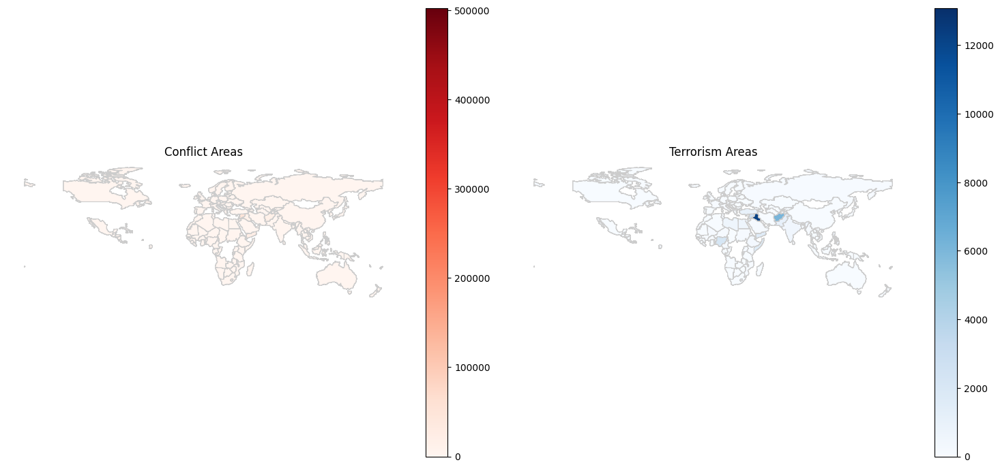

In [46]:
# Load the world map shapefile
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Create a DataFrame from your continent mapping
continent_df = pd.DataFrame(continent_mapping.items(), columns=['Continent', 'Countries'])

# Merge the continent mapping DataFrame with your conflict and terrorism rates DataFrame
merged_df = pd.merge(continent_df.explode('Countries'), df[['Entity', 'Conflict (deaths)', 'Terrorism (deaths)']], left_on='Countries', right_on='Entity', how='left')

# Merge with the world map data
world = world.merge(merged_df, left_on='name', right_on='Countries', how='left')

# Plotting the map
fig, ax = plt.subplots(1, 2, figsize=(15, 7))

# Plot conflict areas
world.plot(column='Conflict (deaths)', cmap='Reds', linewidth=0.8, ax=ax[0], edgecolor='0.8', legend=True)
ax[0].set_title('Conflict Areas')
ax[0].axis('off')

# Plot terrorism areas
world.plot(column='Terrorism (deaths)', cmap='Blues', linewidth=0.8, ax=ax[1], edgecolor='0.8', legend=True)
ax[1].set_title('Terrorism Areas')
ax[1].axis('off')

plt.tight_layout()
plt.show()
